In [621]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score
from sklearn.neighbors import NearestNeighbors
from pandas_profiling import ProfileReport
%matplotlib inline

In [622]:
df = pd.read_csv("credit_card.csv")

In [623]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

## Data processing

### rename columns

In [624]:
# rename the column
# ca_trx is changed into _transaction_number
# purchases_trx is changed into puchase_transaction_number
df.columns = ['cust_id', 'balance', 'balance_frequency', 
              'purchase', 'oneoff_purchase', 'installment_purchase', 'cash_advance', 
              'purchase_frequency', 'oneoff_purchase_frequency',
              'purchase_installment_frequency', 'cash_advance_frequency',
               'cash_advance_transaction_number', 'purchase_transaction_number',
               'credit_limit', 'payment', 'minimum_payment', 'percent_full_payment','tenure']

In [625]:
df

,cust_id,balance,balance_frequency,purchase,oneoff_purchase,installment_purchase,cash_advance,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,payment,minimum_payment,percent_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


drop cust_id column

In [626]:
df = df.drop('cust_id', axis=1)

In [627]:
# ProfileReport(df, title="Credit card data report", explorative=True)

In [628]:
df.describe()
# lots of 0 values, may requiring checking

,balance,balance_frequency,purchase,oneoff_purchase,installment_purchase,cash_advance,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,payment,minimum_payment,percent_full_payment,tenure
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


### type

In [629]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   balance                          8950 non-null   float64
 1   balance_frequency                8950 non-null   float64
 2   purchase                         8950 non-null   float64
 3   oneoff_purchase                  8950 non-null   float64
 4   installment_purchase             8950 non-null   float64
 5   cash_advance                     8950 non-null   float64
 6   purchase_frequency               8950 non-null   float64
 7   oneoff_purchase_frequency        8950 non-null   float64
 8   purchase_installment_frequency   8950 non-null   float64
 9   cash_advance_frequency           8950 non-null   float64
 10  cash_advance_transaction_number  8950 non-null   int64  
 11  purchase_transaction_number      8950 non-null   int64  
 12  credit_limit        

### missing values

In [630]:
df.isnull().sum()

balance                              0
balance_frequency                    0
purchase                             0
oneoff_purchase                      0
installment_purchase                 0
cash_advance                         0
purchase_frequency                   0
oneoff_purchase_frequency            0
purchase_installment_frequency       0
cash_advance_frequency               0
cash_advance_transaction_number      0
purchase_transaction_number          0
credit_limit                         1
payment                              0
minimum_payment                    313
percent_full_payment                 0
tenure                               0
dtype: int64

#### try four ways

* just replace missing value with median, and ignore outliers
* use knn imputer, use iqr identifying outliers
* use knn imputer, use zscore identifying outliers

In [631]:
df1 = df.copy(deep=True)

In [632]:
df2 = df.copy(deep=True)

In [633]:
df3 = df.copy(deep=True)

In [634]:
df1.dropna(subset = ["credit_limit"], inplace = True)
df1

,balance,balance_frequency,purchase,oneoff_purchase,installment_purchase,cash_advance,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,payment,minimum_payment,percent_full_payment,tenure
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [635]:
df1.loc[df["minimum_payment"].isnull()]

,balance,balance_frequency,purchase,oneoff_purchase,installment_purchase,cash_advance,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,payment,minimum_payment,percent_full_payment,tenure
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.0,12
45,2242.311686,1.000000,437.00,97.00,340.0,184.648692,0.333333,0.083333,0.333333,0.166667,2,5,2400.0,0.000000,NaN,0.0,12
47,3910.111237,1.000000,0.00,0.00,0.0,1980.873201,0.000000,0.000000,0.000000,0.500000,7,0,4200.0,0.000000,NaN,0.0,12
54,6.660517,0.636364,310.00,0.00,310.0,0.000000,0.666667,0.000000,0.666667,0.000000,0,8,1000.0,417.016763,NaN,0.0,12
55,1311.995984,1.000000,1283.90,1283.90,0.0,0.000000,0.250000,0.250000,0.000000,0.000000,0,6,6000.0,0.000000,NaN,0.0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8919,14.524779,0.333333,152.00,152.00,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,1500.0,0.000000,NaN,0.0,6
8929,371.527312,0.333333,0.00,0.00,0.0,1465.407927,0.000000,0.000000,0.000000,0.166667,5,0,1500.0,0.000000,NaN,0.0,6
8935,183.817004,1.000000,465.90,0.00,465.9,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1500.0,0.000000,NaN,0.0,6
8944,193.571722,0.833333,1012.73,1012.73,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,NaN,0.0,6


(0.0, 5000.0)

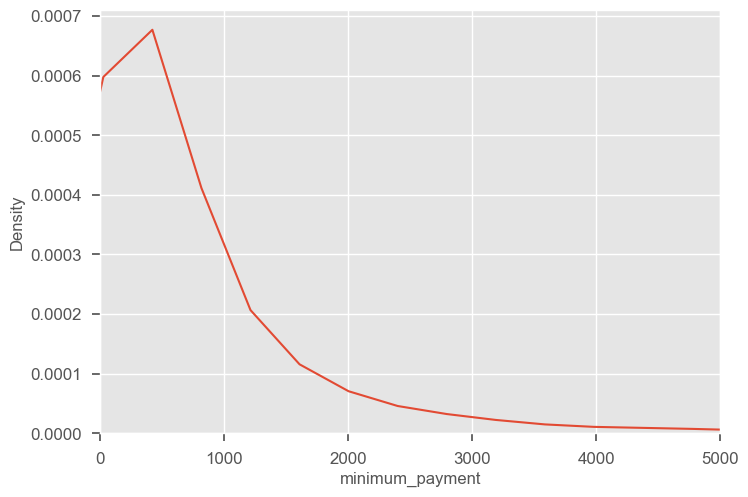

In [636]:
ax = sns.kdeplot(data=df1, x="minimum_payment")
ax.set_xlim(0, 5000)

Judging from the density plot, it is right skewed. The mdedian is a better choice than the mean

In [637]:
df1['minimum_payment'].fillna(df1['minimum_payment'].median(), inplace = True)
df = df1
df1.isnull().sum()

balance                            0
balance_frequency                  0
purchase                           0
oneoff_purchase                    0
installment_purchase               0
cash_advance                       0
purchase_frequency                 0
oneoff_purchase_frequency          0
purchase_installment_frequency     0
cash_advance_frequency             0
cash_advance_transaction_number    0
purchase_transaction_number        0
credit_limit                       0
payment                            0
minimum_payment                    0
percent_full_payment               0
tenure                             0
dtype: int64

### Outliers

#### use IQR

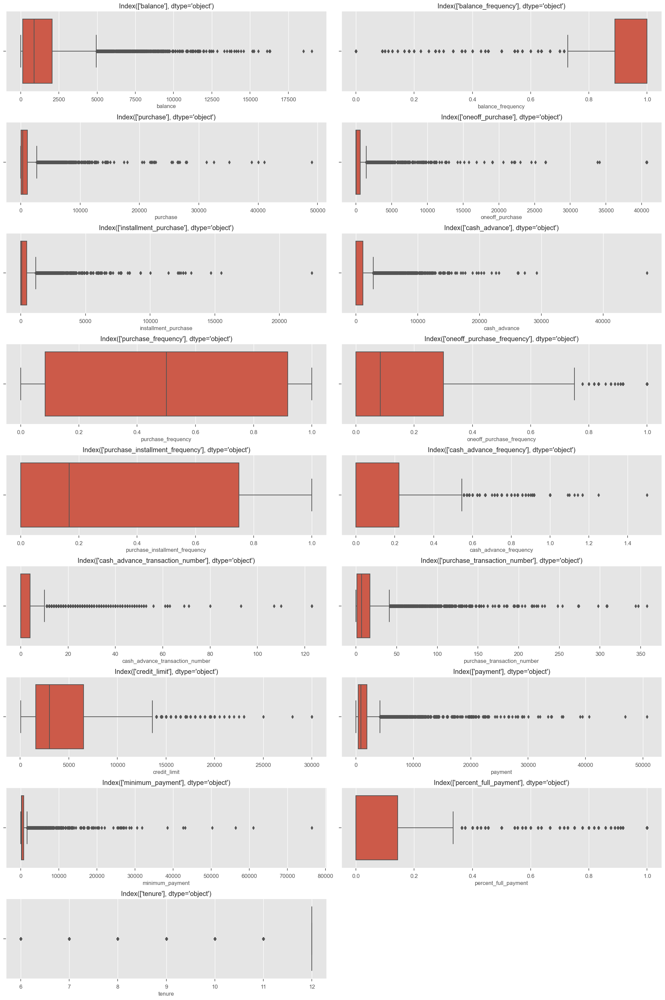

In [638]:
plt.figure(figsize=(20, 30))
for i in range(len(df.columns)):
    plt.subplot(9,2,i+1)
    sns.boxplot(x = df.columns[i], data=df)
    plt.title(df.columns[[i]])
plt.tight_layout()              

* It looks like there are too many outliers. Further check the percent of outliers

In [639]:
# check the percent of outliers in every column
def outlier_percent(data):
    outliers_data = []
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    minimum = Q1 - (1.5 * IQR)
    maximum = Q3 + (1.5 * IQR)
    num_outliers =  np.sum((data < minimum) |(data > maximum))
    num_total = data.count()
    percent = (num_outliers/num_total)*100
    outliers_data.append(percent)
    return outliers_data

In [640]:
outlier_percent(df)

[balance                             7.766231
 balance_frequency                  16.672254
 purchase                            9.028942
 oneoff_purchase                    11.319701
 installment_purchase                9.688233
 cash_advance                       11.509666
 purchase_frequency                  0.000000
 oneoff_purchase_frequency           8.738407
 purchase_installment_frequency      0.000000
 cash_advance_frequency              5.866577
 cash_advance_transaction_number     8.984244
 purchase_transaction_number         8.559616
 credit_limit                        2.771259
 payment                             9.028942
 minimum_payment                    10.157560
 percent_full_payment               16.471114
 tenure                             15.253101
 dtype: float64]

In [641]:
for i in df2.columns:
    data = df2[i]
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    minimum = q1 - (1.5 * iqr)
    maximum = q3 + (1.5 * iqr)
    outliers = ((data<minimum) | (data>maximum))
    df2[i].loc[outliers] = np.nan
df2.isna().sum()

/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/1476567009.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2[i].loc[outliers] = np.nan
/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/1476567009.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2[i].loc[outliers] = np.nan
/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/1476567009.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


balance                             695
balance_frequency                  1493
purchase                            808
oneoff_purchase                    1013
installment_purchase                867
cash_advance                       1030
purchase_frequency                    0
oneoff_purchase_frequency           782
purchase_installment_frequency        0
cash_advance_frequency              525
cash_advance_transaction_number     804
purchase_transaction_number         766
credit_limit                        249
payment                             808
minimum_payment                    1154
percent_full_payment               1474
tenure                             1366
dtype: int64

In [642]:
df2 = pd.DataFrame(KNNImputer().fit_transform(df2), columns=df2.columns)
df2.isna().sum()

balance                            0
balance_frequency                  0
purchase                           0
oneoff_purchase                    0
installment_purchase               0
cash_advance                       0
purchase_frequency                 0
oneoff_purchase_frequency          0
purchase_installment_frequency     0
cash_advance_frequency             0
cash_advance_transaction_number    0
purchase_transaction_number        0
credit_limit                       0
payment                            0
minimum_payment                    0
percent_full_payment               0
tenure                             0
dtype: int64

### use z-score

In [643]:
def Zscore_outlier(data):
    outliers_data = []
    m = np.mean(data)
    sd = np.std(data)
    num_outliers = np.sum(np.abs((data-m)/sd) > 3)
    num_total = data.count()
    percent = (num_outliers/num_total) * 100
    outliers_data.append(percent)
    return outliers_data

In [644]:
Zscore_outlier(df)

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


[balance                            2.190189
 balance_frequency                  2.033747
 purchase                           1.508548
 oneoff_purchase                    1.363281
 installment_purchase               1.530897
 cash_advance                       2.033747
 purchase_frequency                 0.000000
 oneoff_purchase_frequency          0.000000
 purchase_installment_frequency     0.000000
 cash_advance_frequency             2.223712
 cash_advance_transaction_number    1.922002
 purchase_transaction_number        2.067270
 credit_limit                       1.698514
 payment                            1.776735
 minimum_payment                    1.139792
 percent_full_payment               0.000000
 tenure                             4.391552
 dtype: float64]

* z-score identifies less outliers compared to iqr

In [645]:
for i in df3.columns:
    data = df3[i]
    mean = np.mean(data)
    std = np.std(data)
    outliers = (np.abs((data - mean)/std) > 3)
    df3[i].loc[outliers] = np.nan
df3.isna().sum()

/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/2349475384.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3[i].loc[outliers] = np.nan


balance                            196
balance_frequency                  176
purchase                           135
oneoff_purchase                    122
installment_purchase               137
cash_advance                       182
purchase_frequency                   0
oneoff_purchase_frequency            0
purchase_installment_frequency       0
cash_advance_frequency             199
cash_advance_transaction_number    172
purchase_transaction_number        185
credit_limit                       153
payment                            159
minimum_payment                    413
percent_full_payment                 0
tenure                             394
dtype: int64

In [646]:
df3 = pd.DataFrame(KNNImputer().fit_transform(df3),
                                columns = df3.columns)
df3.isna().sum()

balance                            0
balance_frequency                  0
purchase                           0
oneoff_purchase                    0
installment_purchase               0
cash_advance                       0
purchase_frequency                 0
oneoff_purchase_frequency          0
purchase_installment_frequency     0
cash_advance_frequency             0
cash_advance_transaction_number    0
purchase_transaction_number        0
credit_limit                       0
payment                            0
minimum_payment                    0
percent_full_payment               0
tenure                             0
dtype: int64

* They ought to be dropped from the dataset, but let's first further check the distribution

### Distribution

#### tackled missing value, ignorant of outliers

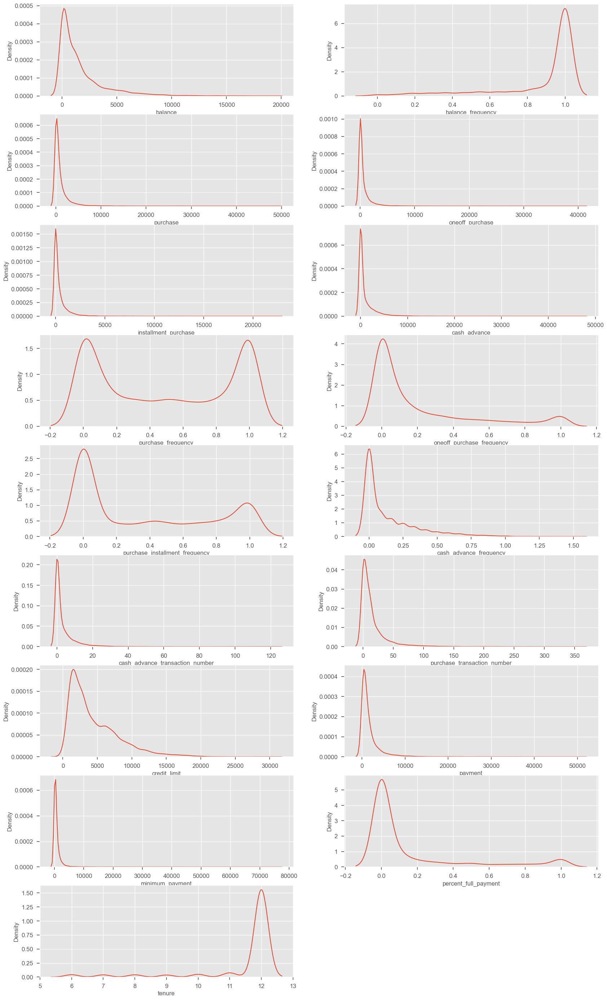

In [647]:
plt.figure(figsize=(20, 35))
for i, col in enumerate(df1.columns):
    ax = plt.subplot(9, 2, i+1)
    sns.kdeplot(df1[col], ax = ax)

#### use IQR excluding outliers and replace them using knn imputer

/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/2273586720.py:4: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df2[col], ax = ax)


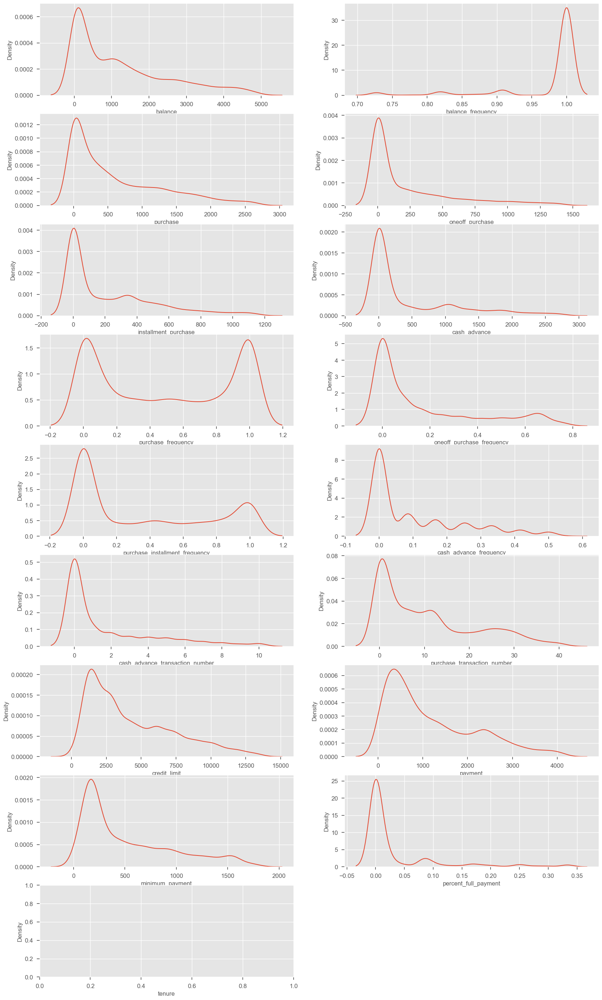

In [648]:
plt.figure(figsize=(20, 35))
for i, col in enumerate(df2.columns):
    ax = plt.subplot(9, 2, i+1)
    sns.kdeplot(df2[col], ax = ax)

#### use z-score identifying outliers and knn imputer to replace them

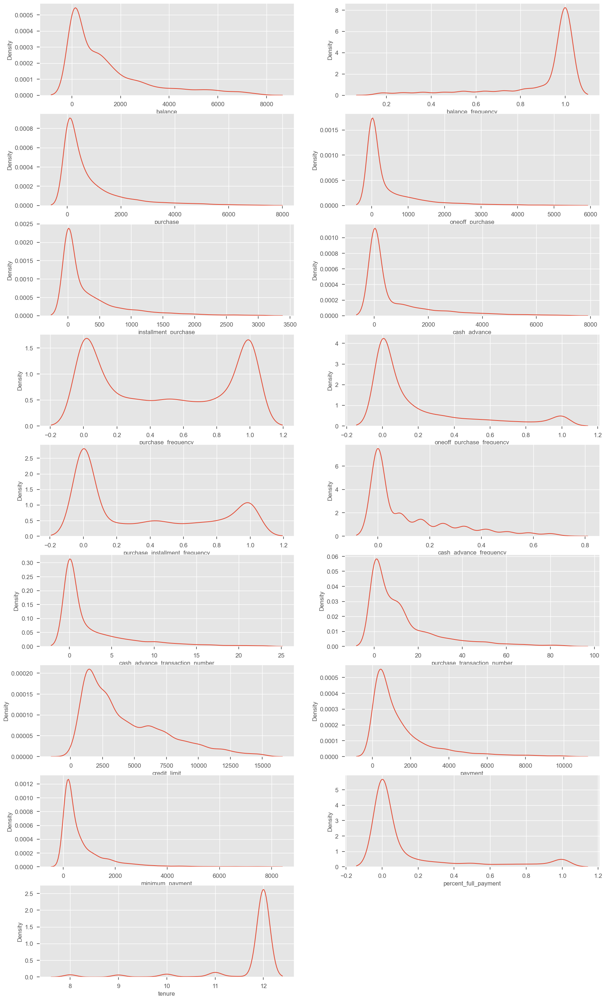

In [649]:
plt.figure(figsize=(20, 35))
for i, col in enumerate(df3.columns):
    ax = plt.subplot(9, 2, i+1)
    sns.kdeplot(df3[col], ax = ax)

In [650]:
print(df['tenure'].unique(), df2['tenure'].unique(), df3['tenure'].unique())

[12  8 11  9 10  7  6] [12.] [12.   8.  11.   9.  10.  10.6 11.4 10.8 11.2  9.6  8.8 11.8  9.4 11.6
  9.8 10.4 10.2  9.2]


* Very interesting, excluding outliers identified by iqr wipe out various value of tenure.
* the original distribution is too skewed, indicating outliers requires to be dealt with.
* Compared to iqr, using z-score to identify outliers is more gentle, but it change the distribution less than iqr. It at least reserves various values of tenure.
* However, judging from the values of df3, it is clear that knn imputer that used to replace outliers changes the values of df3, wiping out tenure 6 and 7

#### use log to further optimize the distribution

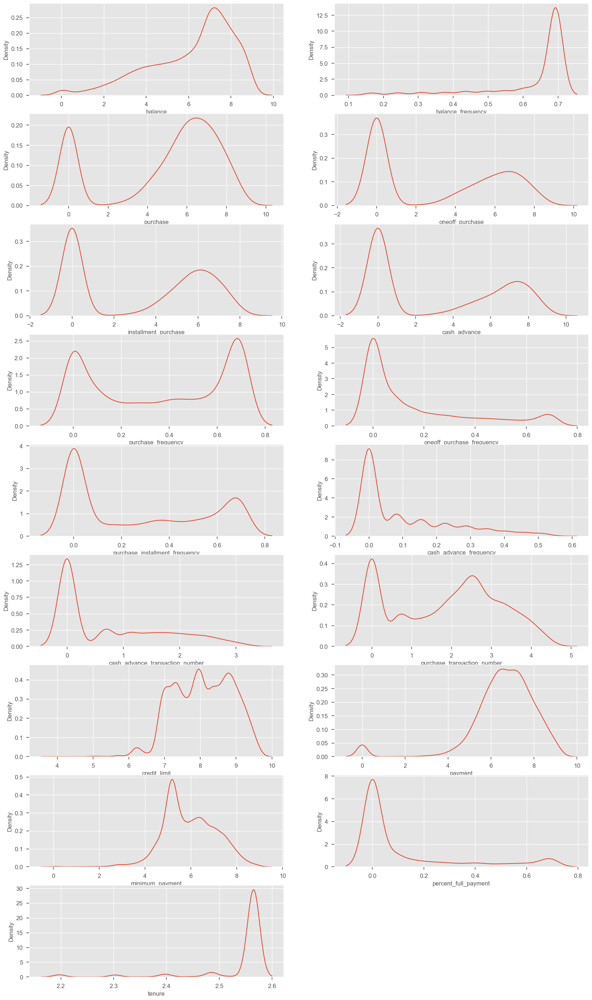

In [651]:
df4 = df3.copy(deep=True)

for col in df4.columns: 
    df4[col] = np.log(1 + df4[col])
plt.figure(figsize=(20, 35))

for i, col in enumerate(df4.columns):
    ax = plt.subplot(9, 2, i+1)
    sns.kdeplot(df4[col], ax = ax)

* It seems that this dataset is not suitable for log transformation.
    * balance changes from right skewed to left skewed
    * distributions of payment, purchase and other attributes are changed dramatically, which is detrimental for the clustering analysis

* Prefered choice: not deal with outliers or use z-score identifies outliers and replace them with knn imputer
* All distributions are skewed. But in reality, it is expected that few people that are really rich will twisted the distribution of money spent. The outliers and skewed distribution reflected the wealth distribution in reality.
* Besides, the aim of the paper is to cluster and group customers, where very wealthy customers are a part of the total customers. Their characteristics require to be researched too. Since IQR changes the distribution more than z-score, z-score may be the final choice.

### Standardization

* I don't want to change the distribution much. I want to limit the information loss in the mormalization process to minimum. 
* Therefore, compared to standardscaler, minmaxscaler is a better choice since it only changes the range

In [652]:
# judging from the plots comparing in the exploratory data analysis part, 
# the final choice is replacing missing values with the median, ignoring outliers and distributions.
x = pd.DataFrame(StandardScaler().fit_transform(df), columns=df.columns)
x

,balance,balance_frequency,purchase,oneoff_purchase,installment_purchase,cash_advance,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,payment,minimum_payment,percent_full_payment,tenure
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.302427,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.097453,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.093330,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.228291,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.257295,-0.525588,0.360541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,-0.738015,0.517980,-0.333331,-0.356957,-0.132688,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.486266,-0.341275,1.183844,-4.126919
8945,-0.742488,0.517980,-0.329174,-0.356957,-0.122869,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.503445,-0.228291,-0.525588,-4.126919
8946,-0.740463,-0.185895,-0.402000,-0.356957,-0.294930,-0.466805,0.854463,-0.678716,0.760359,-0.675294,-0.476083,-0.390691,-0.960380,-0.570660,-0.326900,0.329128,-4.126919
8947,-0.745239,-0.185895,-0.469584,-0.356957,-0.454607,-0.449373,-1.221928,-0.678716,-0.917090,0.157536,-0.183026,-0.591841,-1.097795,-0.580581,-0.338330,0.329128,-4.126919


#### Conclusion about preprocessing data

* The aim of the process is to find clusters and interpret clusters to extract information from the different groups. 
* Because the outliers and skewed distribution in the credit card dataset kinds of reflect the reality of wealth distribution (very few people pocess lot of money), they are not dealt with or dealt with a more gentle approach, z-score and knn imputer.
* Since the range of attributes affect the model like pca which computes distance, its range is dealt with normalization.
* The final decision about outliers will be decided after visualization

## Exploratory data analysis

<AxesSubplot: >

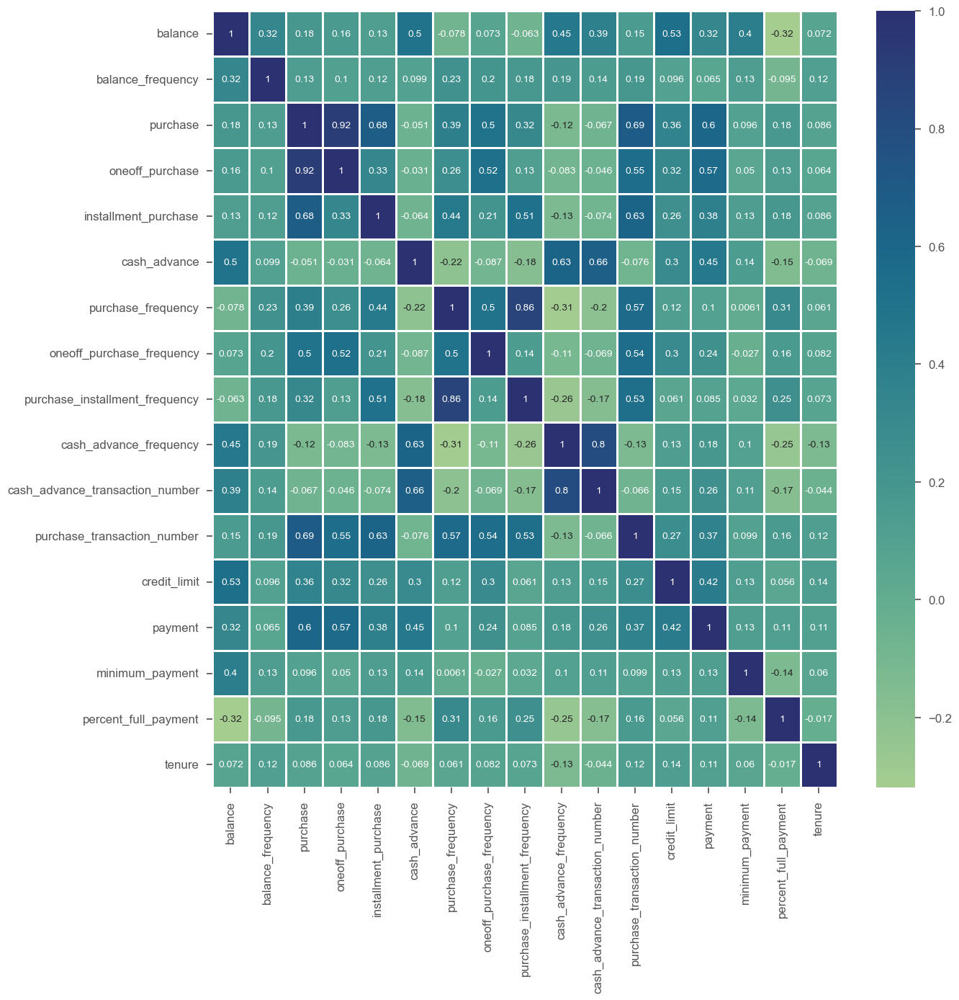

In [653]:
plt.figure(figsize=(14, 14))
sns.heatmap(data = df.corr(), annot = True,  cmap = "crest", linewidth=2)

* Some of the columns are highly correlated (correlation coefficients between 0.8 ~ 1.0)
* But it is not a problem for clustering, and it indicated that there would be some connected columns which benefit us to better group card users.

#### Split the columns into four parts

In [654]:
df.columns

Index(['balance', 'balance_frequency', 'purchase', 'oneoff_purchase',
       'installment_purchase', 'cash_advance', 'purchase_frequency',
       'oneoff_purchase_frequency', 'purchase_installment_frequency',
       'cash_advance_frequency', 'cash_advance_transaction_number',
       'purchase_transaction_number', 'credit_limit', 'payment',
       'minimum_payment', 'percent_full_payment', 'tenure'],
      dtype='object')

* Areas: 
    * general condition: 'balance', 'balance_frequency', 'credit_limit', 'tenure',
    * purchase type: 'purchase', 'oneoff_purchase', 'installments_purchase', 'cash_advance'
    * purchase frequency:  'purchase_frequency', 'oneoff_purchase_frequency', 'purchase_installment_frequency', 'cash_advance_frequency', 'cash_advance_transaction_number', 'purchase_transaction_number', 
    * payment: 'payment', 'minimum_payment', 'percent_full_payment'
* Considering the business need of banks, tenure and credit limit are variables that controled by the bank. Therefore, they are attributes linked with strategy making and they will added into each group.

In [655]:
df_gc = df[['balance', 'balance_frequency', 'credit_limit', 'tenure']]
df3_gc = df3[['balance', 'balance_frequency', 'credit_limit', 'tenure']]

df_pt = df[['purchase', 'oneoff_purchase', 'installment_purchase', 'cash_advance', 'credit_limit', 'tenure']]
df_pf = df[['purchase_frequency', 'oneoff_purchase_frequency', 'purchase_installment_frequency', 
            'cash_advance_frequency', 'cash_advance_transaction_number', 'purchase_transaction_number', 'credit_limit', 'tenure']]
df_p = df[['payment', 'minimum_payment', 'percent_full_payment','credit_limit', 'tenure']]


### Genral condition (first plot is after outliers dealt with, second plot is after outliers without dealt with)

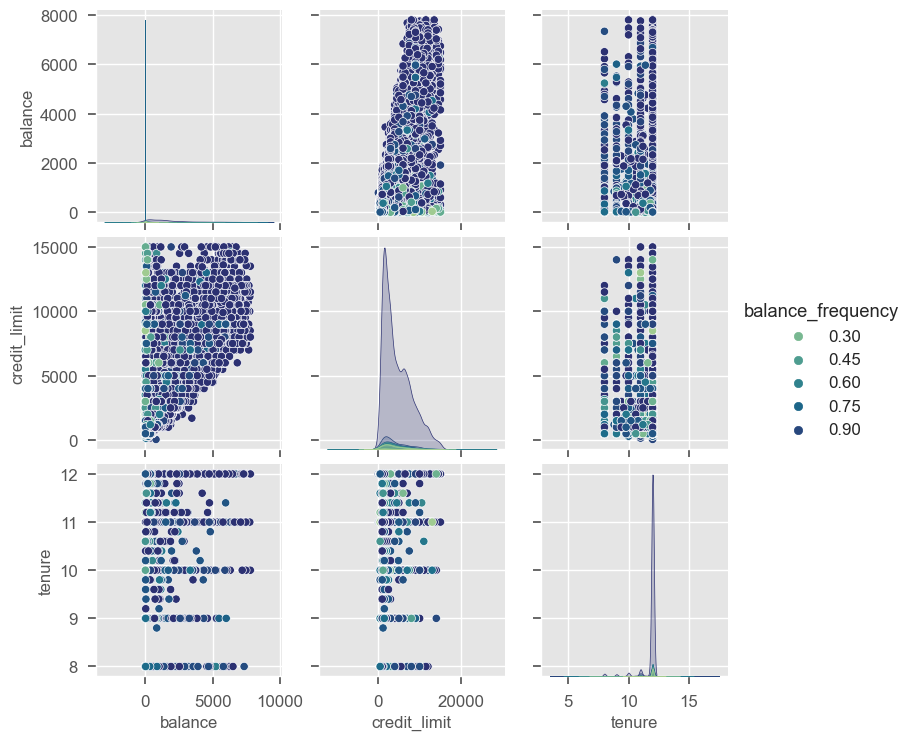

In [656]:
# plots dealt with outliers
sns.pairplot(data=df3_gc, palette="crest", hue="balance_frequency")

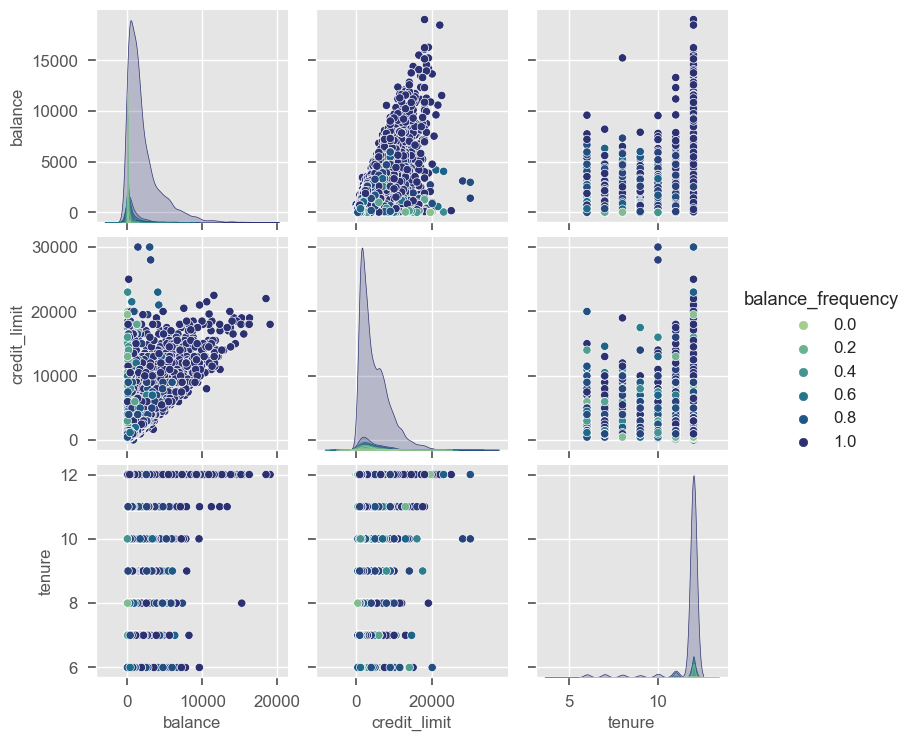

In [657]:
# plot without dealing with outlies
sns.pairplot(data=df_gc, palette="crest", hue="balance_frequency")

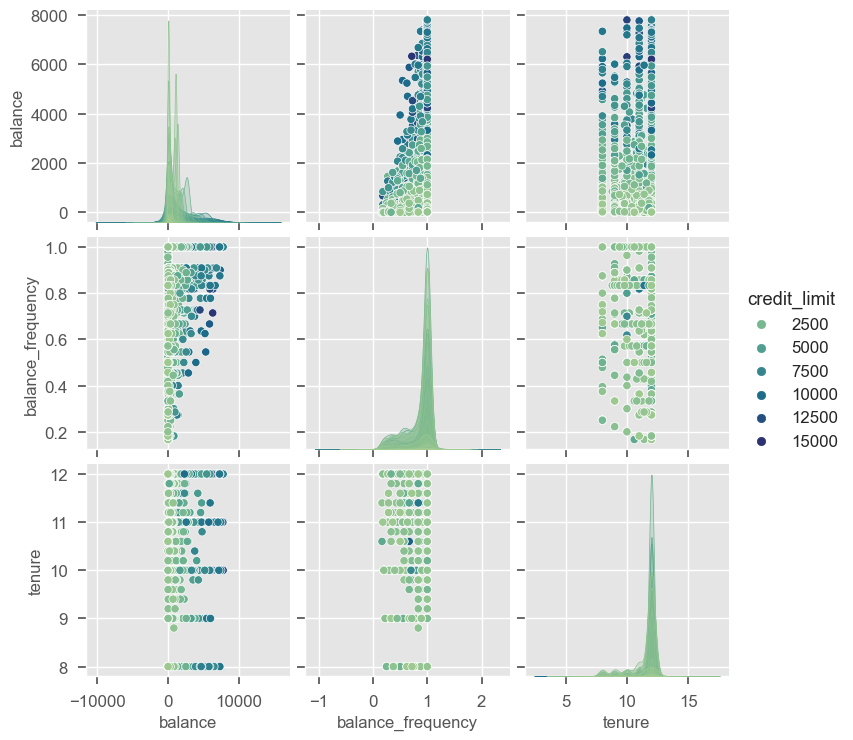

In [658]:
# plot dealt with outliers
sns.pairplot(data=df3_gc, palette="crest", hue="credit_limit")

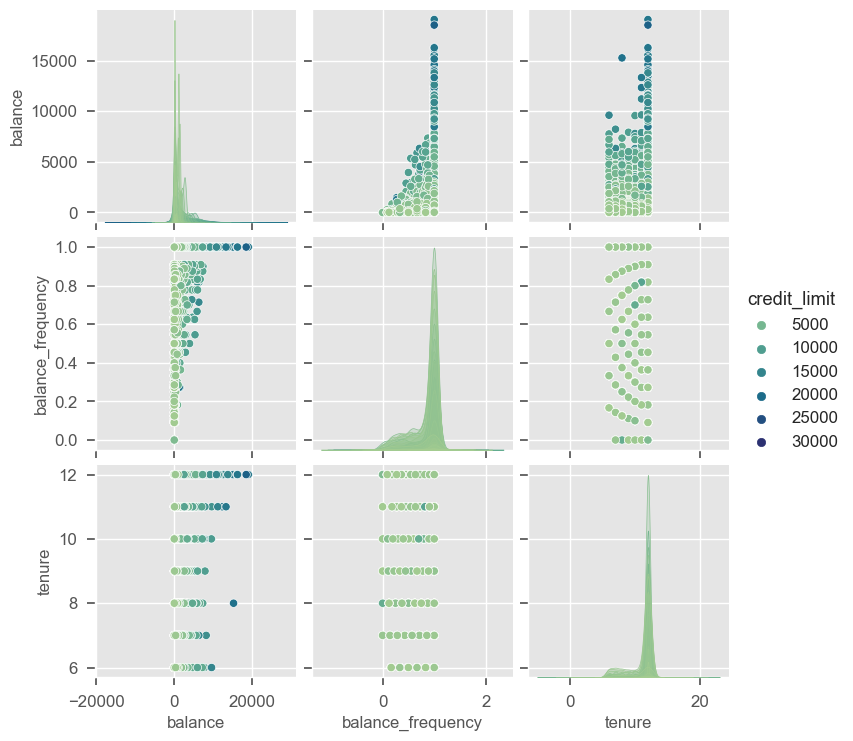

In [659]:
# plot without dealing with outliers
sns.pairplot(data=df_gc, palette="crest", hue="credit_limit")

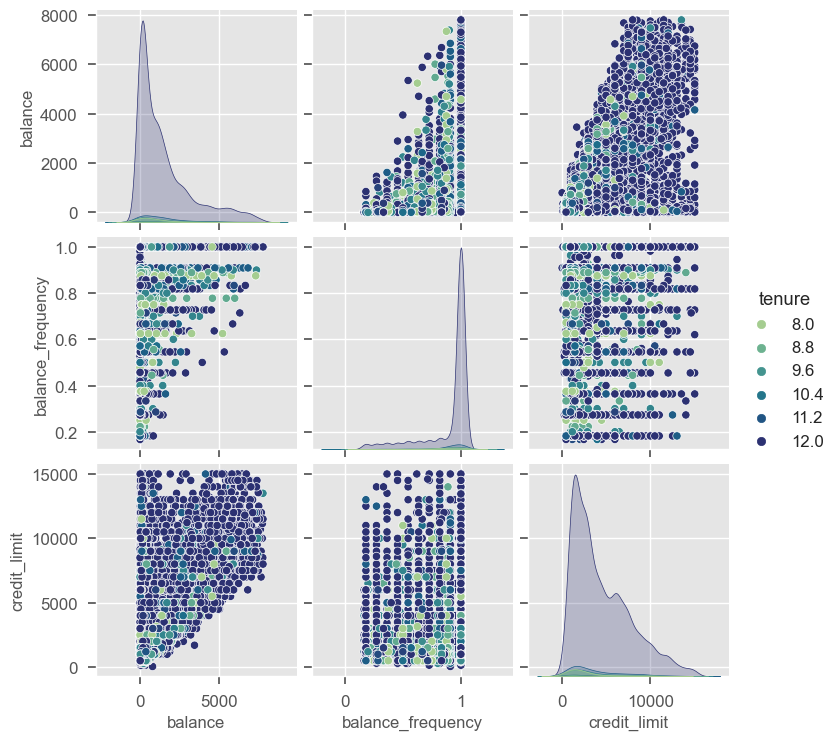

In [660]:
# dealt with outliers
sns.pairplot(data=df3_gc, palette="crest", hue="tenure")

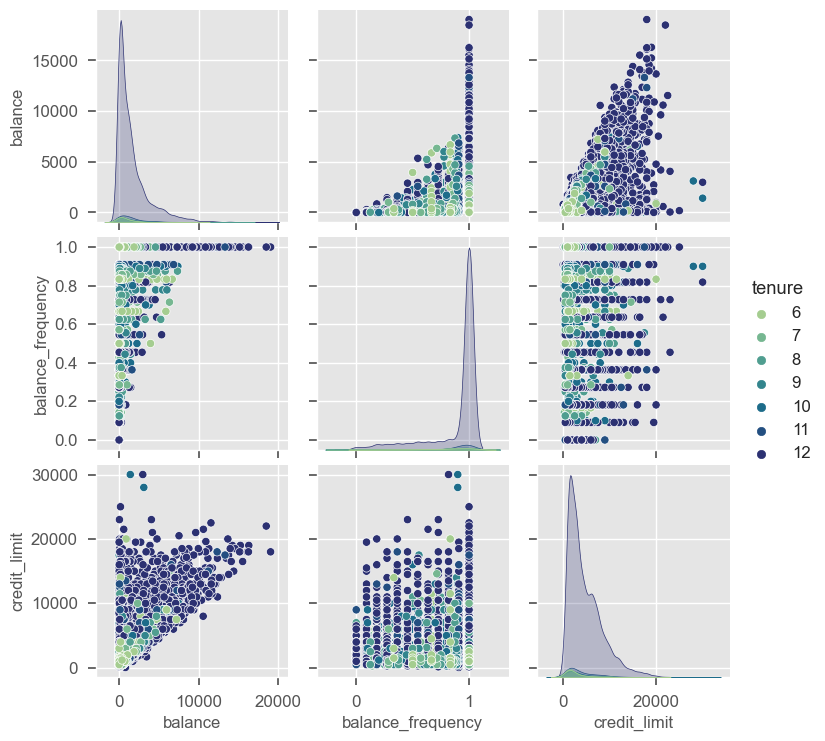

In [661]:
# without dealing with outliers
sns.pairplot(data=df_gc, palette="crest", hue="tenure")

<AxesSubplot: >

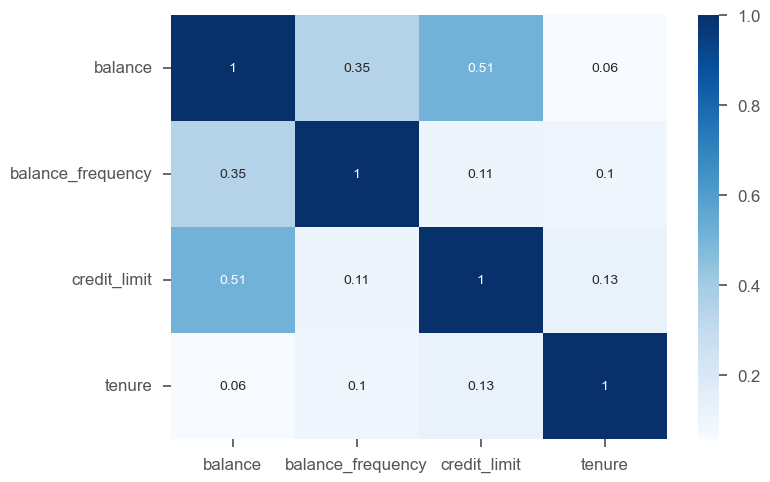

In [662]:
sns.heatmap(data=df3_gc.corr(), cmap="Blues", annot=True)

<AxesSubplot: >

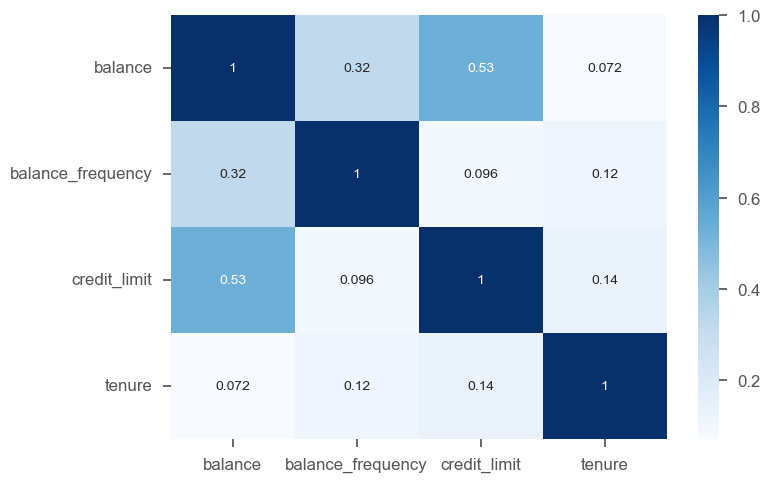

In [663]:
sns.heatmap(data=df_gc.corr(), cmap="Blues", annot=True)

<AxesSubplot: xlabel='balance', ylabel='credit_limit'>

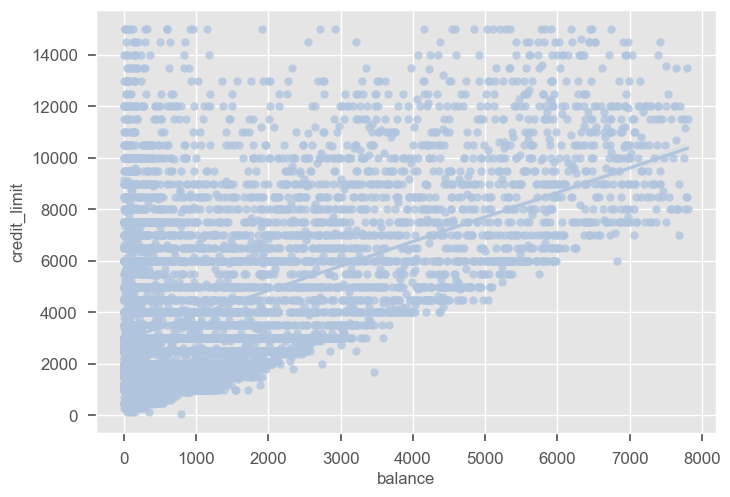

In [664]:
# dealt with outliers
sns.regplot(x="balance", y="credit_limit", data=df3_gc, color='lightsteelblue')

<AxesSubplot: xlabel='balance', ylabel='credit_limit'>

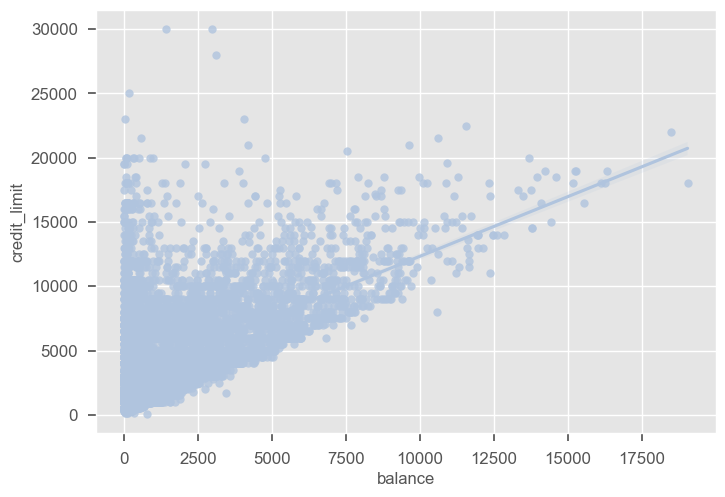

In [665]:
# without dealing with outliers
sns.regplot(x="balance", y="credit_limit", data=df_gc, color='lightsteelblue')

* it is clear that using z-score to identify outliers and replacing them greatly changes some attributes and twists some relationships between attributes
* this problem is detrimental to the information that will be concluded from the visualization
* considering the information loss, the distribution will not be dealt with

* Balance and credit limit are positively correlated.
* Balance and balance frequency are also highly correlated.
* From pairplot, longer tenure are correlated with both higher balance and higher balance frequency
#### Conclusion: 
* Users with higher balance amount left in the account tend to have a better money management habit and they are also more stable customers with longer tenure.

### Purchase type

In [666]:
df_pt.columns

Index(['purchase', 'oneoff_purchase', 'installment_purchase', 'cash_advance',
       'credit_limit', 'tenure'],
      dtype='object')

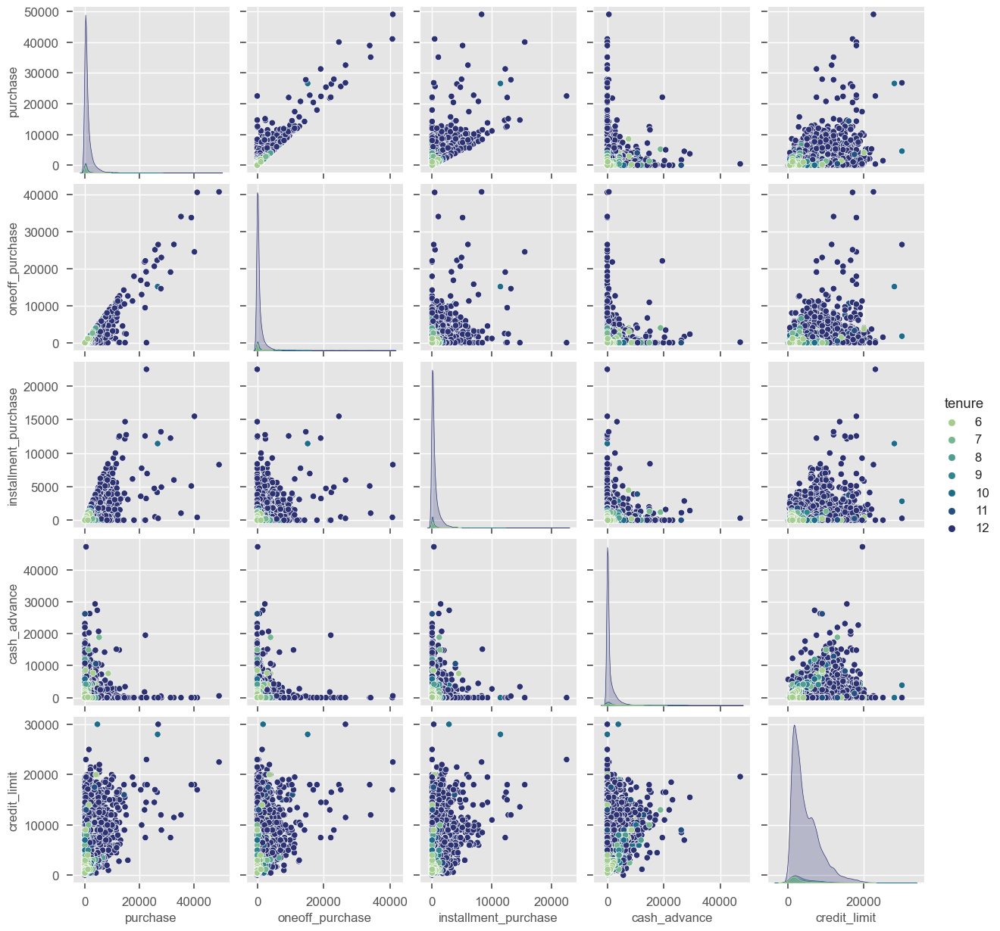

In [667]:
sns.pairplot(data = df_pt, hue="tenure", palette="crest")

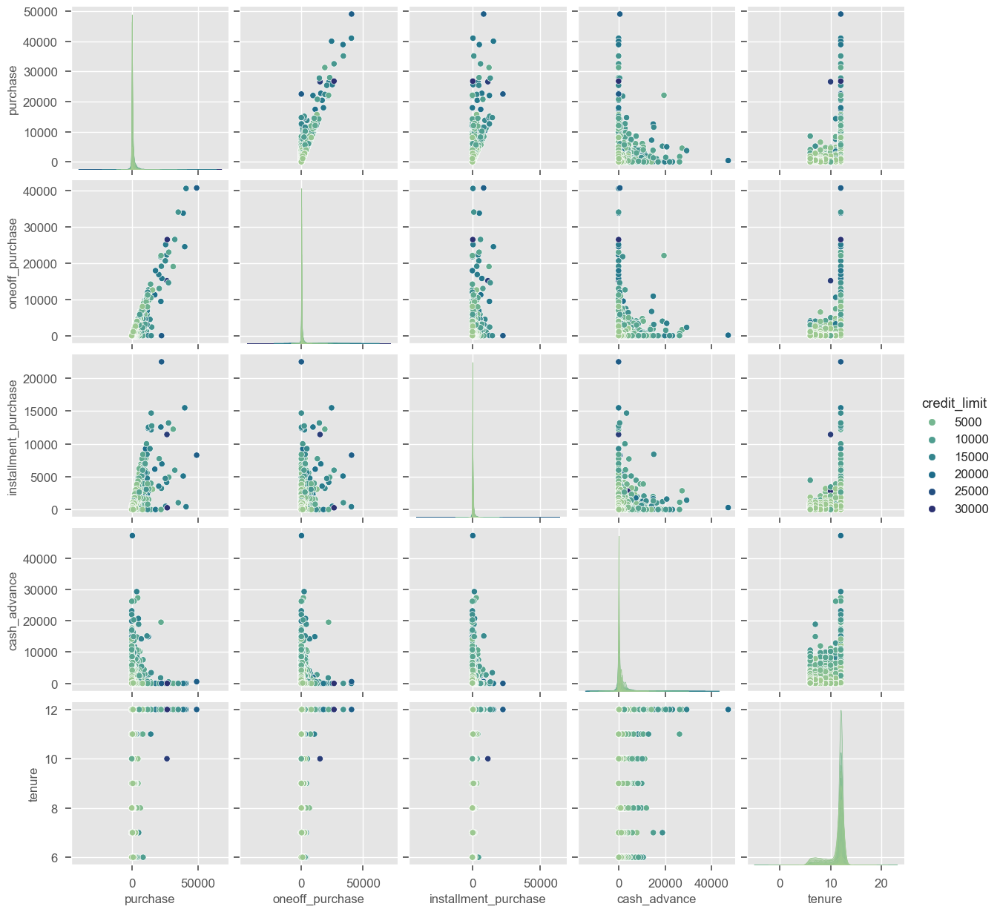

In [668]:
sns.pairplot(data = df_pt, hue="credit_limit", palette="crest")

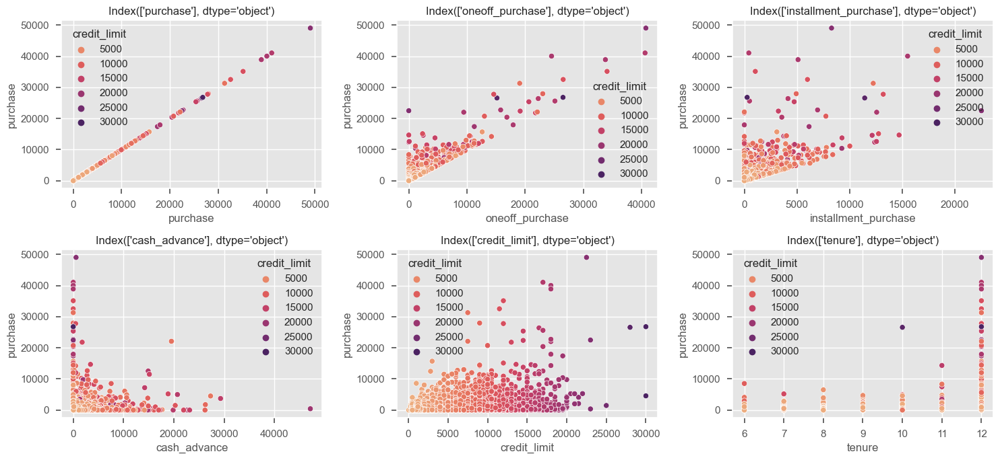

In [669]:
sns.set_context('notebook')
plt.figure(figsize=(15, 7))
for i in range(len(df_pt.columns)):
    plt.subplot(2,3,i+1)
    sns.scatterplot(x = df_pt.columns[i], y="purchase", data=df_pt, hue="credit_limit", palette="flare")
    plt.title(df_pt.columns[[i]])
plt.tight_layout()      

* purchase type:
    * oneoff purchase, installment purchase are positive related.
    * cash advance is negative related. It may indicate another kind of customer.
* credit limit:
    * higher credit limit customers tend to use more one-off purchase and installment purchase
* tenure:
    * tenure is not clearly linked with various purchase behaviours.

<AxesSubplot: >

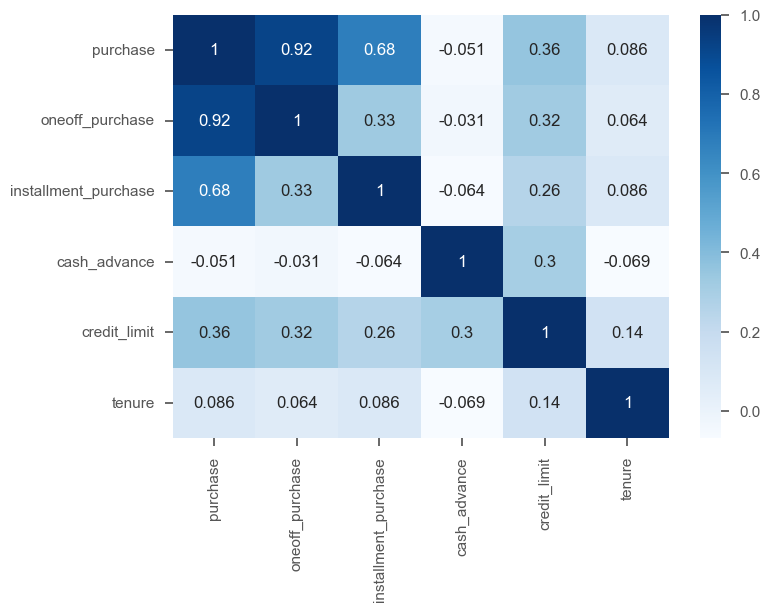

In [670]:
sns.heatmap(data = df_pt.corr(), cmap="Blues", annot=True)

#### Conslusion:
* In purchase area: 
    * Total puchase is correlated with oneoff_purchase, installment_purchase, indicating that credit customers tend to purchase stuff in one time or use installments provided by the credit card.
* As for credit limit and tenure:
    * Credit limit is linked with the total purchase. High credit limit customers tend to purchase more. More interesting, they use cash advance service more.
    * Tenure don't have apparent links with these attributes.

### Purchase frequency

In [671]:
df_pf

,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,tenure
0,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,12
1,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,12
2,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,12
3,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,12
4,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,12
...,...,...,...,...,...,...,...,...
8945,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6
8946,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,6
8947,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,6
8948,0.000000,0.000000,0.000000,0.166667,2,0,500.0,6


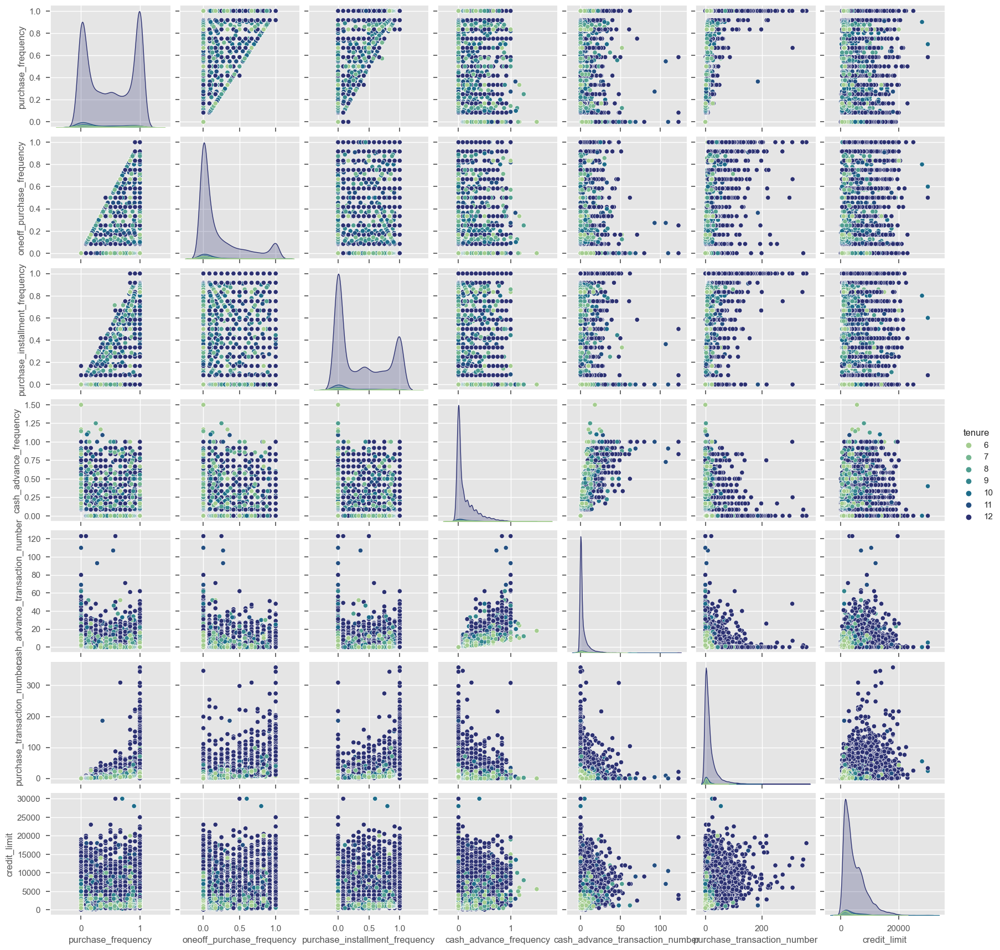

In [672]:
sns.pairplot(data = df_pf, hue="tenure", palette="crest")

* longer tenure customers tend to have more purchase bahaviours.
* higher purchase frequency is linked with higher oneoff purchase frequency and installment purchase frequency

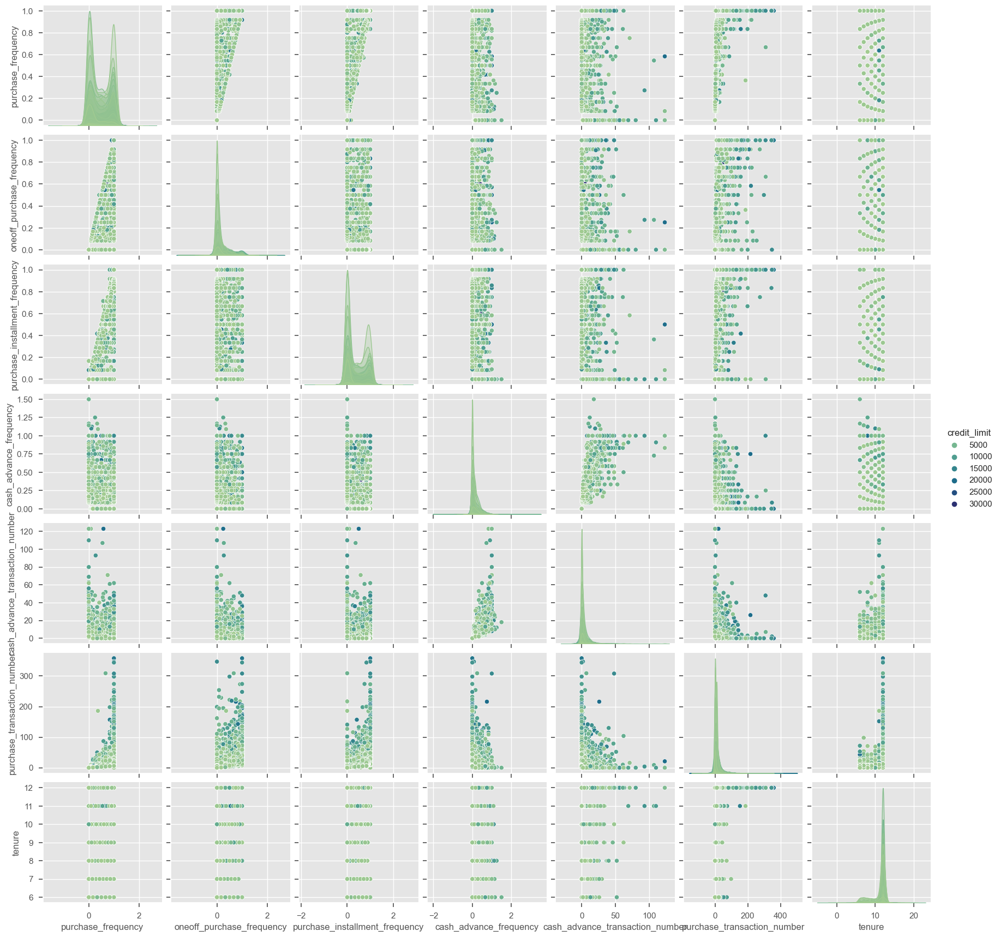

In [673]:
sns.pairplot(data = df_pf, hue="credit_limit", palette="crest")

* for freqency attributes, pairplot provides limited information 
* it is clear that credit limit lacks as significant relationship with other attribtues as tenure

<AxesSubplot: >

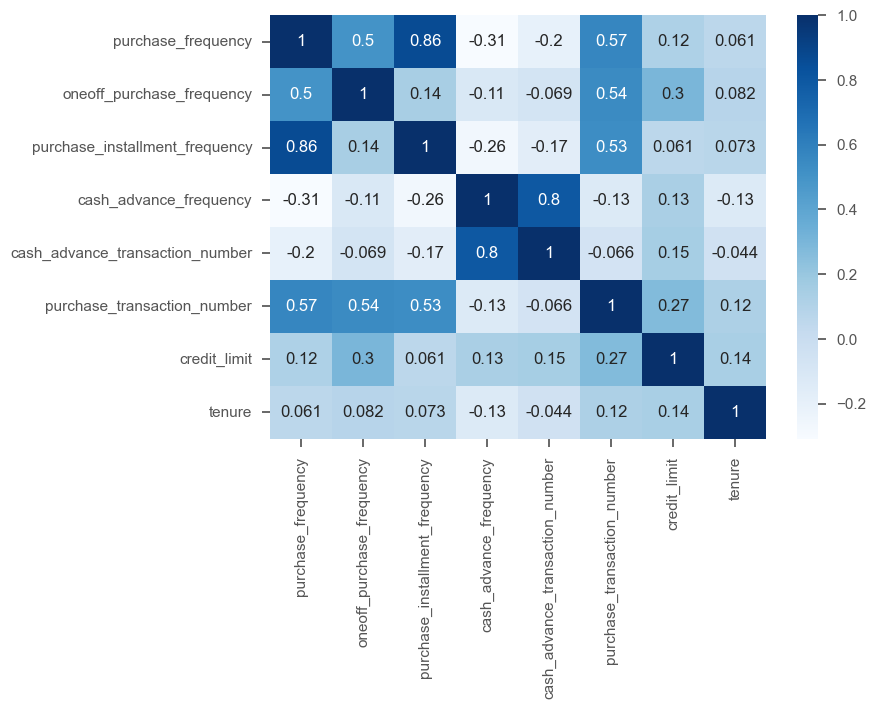

In [674]:
sns.heatmap(data=df_pf.corr(), cmap="Blues", annot=True)

* purchase transaction number is linked with installment frequency, oneoff frequency like purchase frequency.
* purchase frequency, purchase installment frequency, oneoff purchase, cash advance frequency requires further check

/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/3677826224.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sns.kdeplot(df_pf["oneoff_purchase_frequency"], color="green", ax=axis[0],shade=True);
/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/3677826224.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sns.kdeplot(df_pf["purchase_frequency"], color="blue", ax=axis[0], shade=True )
/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/3677826224.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sns.kdeplot(df_pf["purchase_installment_frequency"], color="green", ax=axis[1],shade=True);
/var/fold

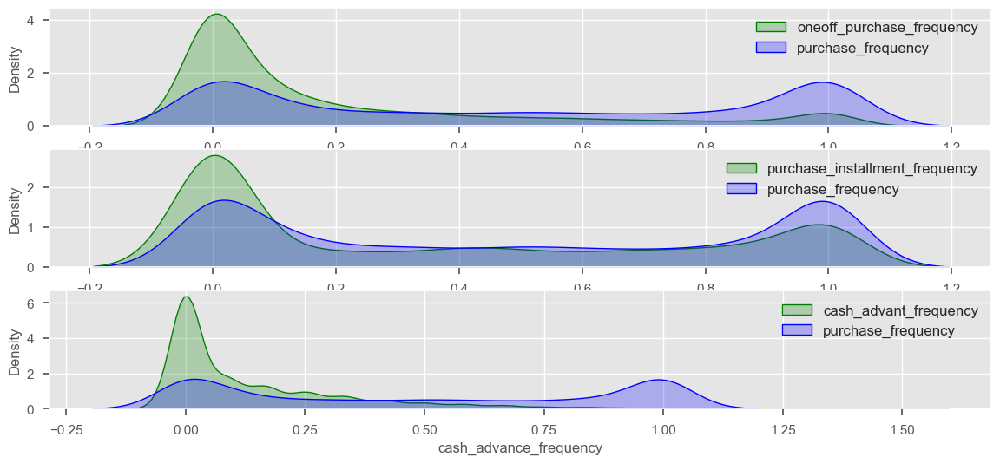

In [675]:
fig, axis = plt.subplots(3,1, figsize=(14, 6))
sns.set_context('notebook', font_scale=1.1)

ax = sns.kdeplot(df_pf["oneoff_purchase_frequency"], color="green", ax=axis[0],shade=True);
ax = sns.kdeplot(df_pf["purchase_frequency"], color="blue", ax=axis[0], shade=True )
ax.legend(["oneoff_purchase_frequency", "purchase_frequency"], loc="upper right")
ax.set_xlabel("oneoff_purchase_frequency")

ax = sns.kdeplot(df_pf["purchase_installment_frequency"], color="green", ax=axis[1],shade=True);
ax = sns.kdeplot(df_pf["purchase_frequency"], color="blue", ax=axis[1], shade=True) 
ax.legend(["purchase_installment_frequency", "purchase_frequency"], loc="upper right")

ax = sns.kdeplot(df_pf["cash_advance_frequency"], color="green", ax=axis[2],shade=True);
ax = sns.kdeplot(df_pf["purchase_frequency"], color="blue", ax=axis[2], shade=True) 
ax.legend(["cash_advant_frequency", "purchase_frequency"], loc="upper right")

* cash advant frequency is not as related with purchase frequency as purchase installment frequency and oneoff purchase
* further check 
* For frequency attibutes, density plot is a better choice.

<Figure size 300x300 with 0 Axes>

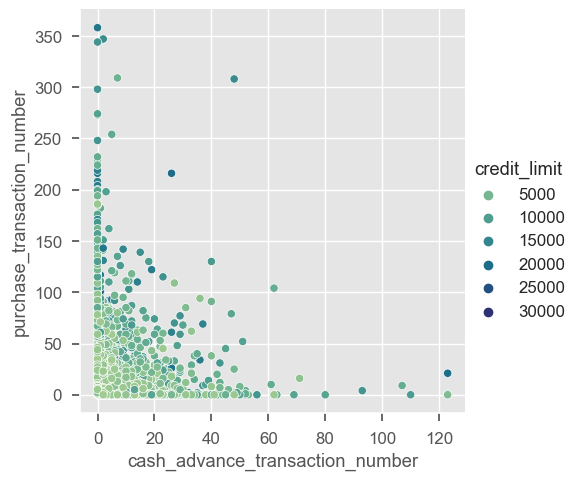

In [676]:
plt.figure(figsize=(3,3))
sns.relplot(data=df_pf, x="cash_advance_transaction_number", y="purchase_transaction_number", hue = "credit_limit", palette="crest")

* cash_advance has slightly negative relationship with purchase frequency
* Customers with higher credit limit tends to hace more purchase transaction number or cash advance number

In [677]:
df_pf.head(5)

,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,tenure
0,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,12
1,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,12
2,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,12
3,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,12
4,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,12


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46],
 [Text(0, 0, '0.0'),
  Text(1, 0, '0.083333'),
  Text(2, 0, '0.090909'),
  Text(3, 0, '0.1'),
  Text(4, 0, '0.111111'),
  Text(5, 0, '0.125'),
  Text(6, 0, '0.142857'),
  Text(7, 0, '0.166667'),
  Text(8, 0, '0.181818'),
  Text(9, 0, '0.2'),
  Text(10, 0, '0.222222'),
  Text(11, 0, '0.25'),
  Text(12, 0, '0.272727'),
  Text(13, 0, '0.285714'),
  Text(14, 0, '0.3'),
  Text(15, 0, '0.333333'),
  Text(16, 0, '0.363636'),
  Text(17, 0, '0.375'),
  Text(18, 0, '0.4'),
  Text(19, 0, '0.416667'),
  Text(20, 0, '0.428571'),
  Text(21, 0, '0.444444'),
  Text(22, 0, '0.454545'),
  Text(23, 0, '0.5'),
  Text(24, 0, '0.545455'),
  Text(25, 0, '0.555556'),
  Text(26, 0, '0.571429'),
  Text(27, 0, '0.583333'),
  Text(28, 0, '0.6'),

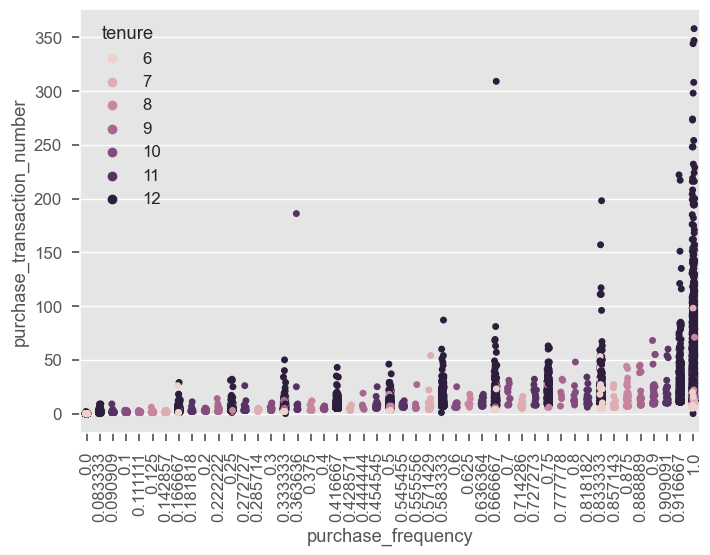

In [678]:
# further check tenure
sns.stripplot(data=df_pf, x="purchase_frequency", y="purchase_transaction_number", hue="tenure")
plt.xticks(rotation = 90)

* longer tenure tends to have more purchase transaction number and higher purchase frequency comparing to customers with shorter tenure

#### Conclusion:
* tenure: Longer tenure custoemrs tend to have more purchase behaviours and more transaction number.
* transaction: transaction number is linked with purchase frequency.
* purchase type: 
    * cash advance frequency is negatively linked with purchase behaviour and it is also less related with installment and oneoff purchase
    * purchase behaviour is positively related with oneoff purchase and install purchase

### payment

In [679]:
df_p.head(5)

,payment,minimum_payment,percent_full_payment,credit_limit,tenure
0,201.802084,139.509787,0.000000,1000.0,12
1,4103.032597,1072.340217,0.222222,7000.0,12
2,622.066742,627.284787,0.000000,7500.0,12
3,0.000000,312.452292,0.000000,7500.0,12
4,678.334763,244.791237,0.000000,1200.0,12


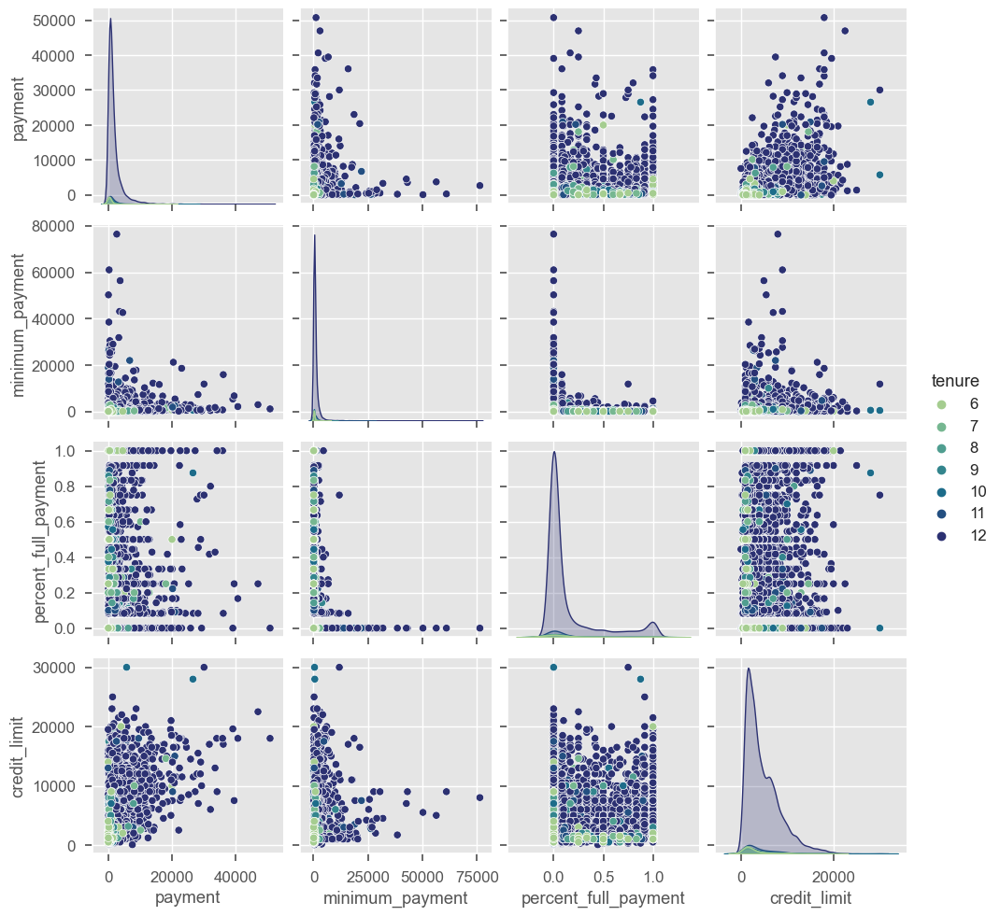

In [680]:
sns.pairplot(data=df_p, palette="crest", hue="tenure")

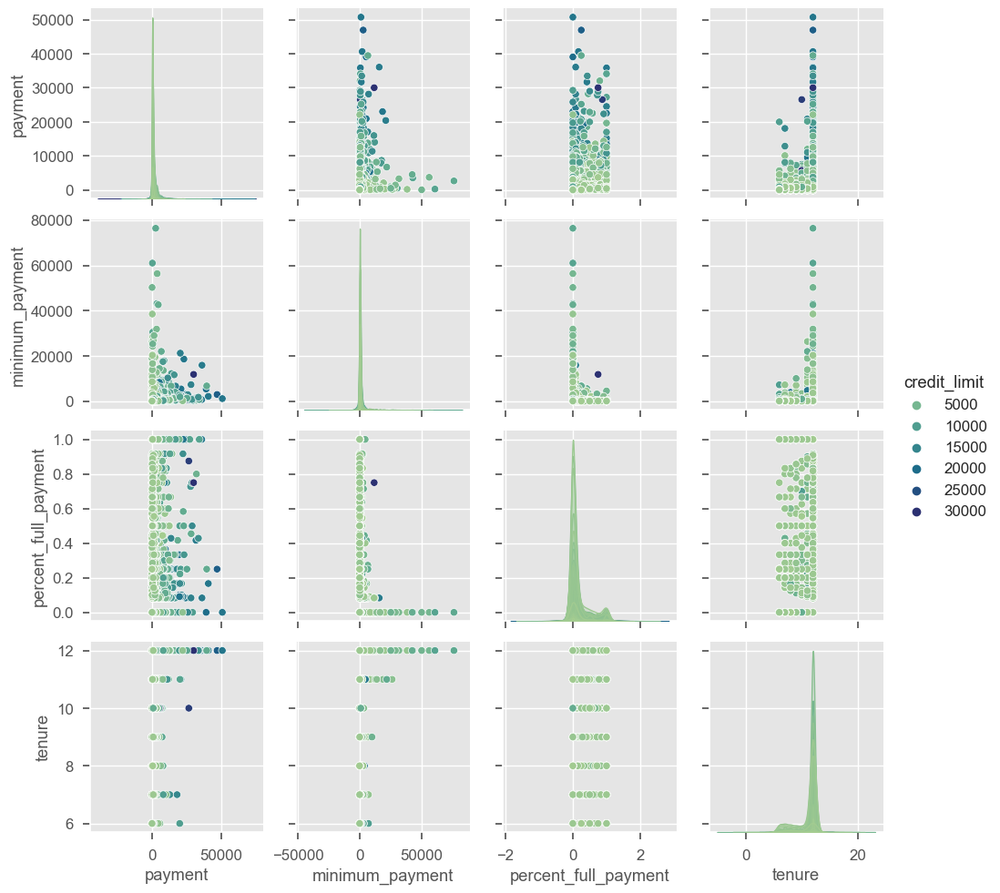

In [681]:
sns.pairplot(data=df_p, palette="crest", hue="credit_limit")

<AxesSubplot: >

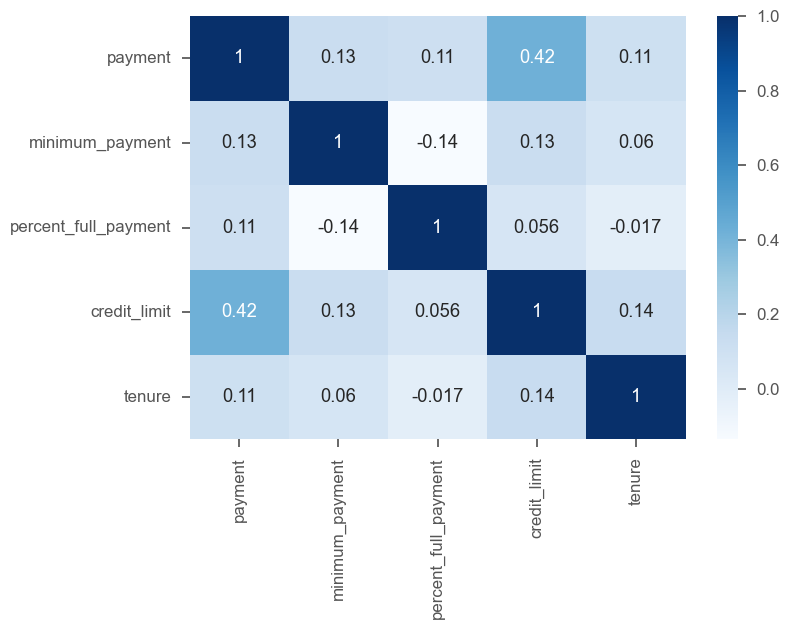

In [682]:
sns.heatmap(data = df_p.corr(), cmap="Blues", annot=True)

* There are only some relationships that have been found.

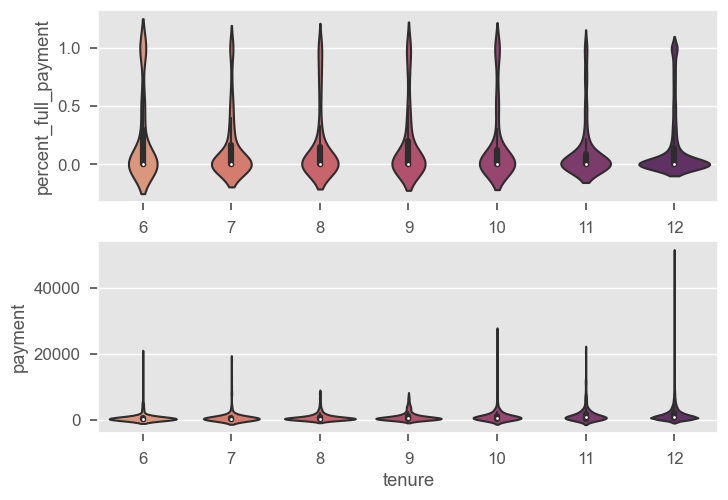

In [683]:
fig, axis = plt.subplots(2, 1)
ax = sns.violinplot(y='percent_full_payment', x="tenure",  data=df_p, ax=axis[0], palette='flare')
ax = sns.violinplot(y = 'payment', x='tenure', data=df_p , ax=axis[1], palette='flare')

* Customers with higher tenure tends to have less full payment which indicates their purchase behaviour is more stable and less impulsive.

/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/2476311917.py:2: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=df_p, x="percent_full_payment", hue="credit_limit", multiple="fill", legend=False, ax=axis[0])
/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/2476311917.py:2: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=df_p, x="percent_full_payment", hue="credit_limit", multiple="fill", legend=False, ax=axis[0])
/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipykernel_1210/2476311917.py:2: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=df_p, x="percent_full_payment", hue="credit_limit", multiple="fill", legend=False, ax=axis[0])
/var/folders/5r/zbxqg81s2b584n57ykhl5x500000gn/T/ipy

<AxesSubplot: xlabel='payment', ylabel='Density'>

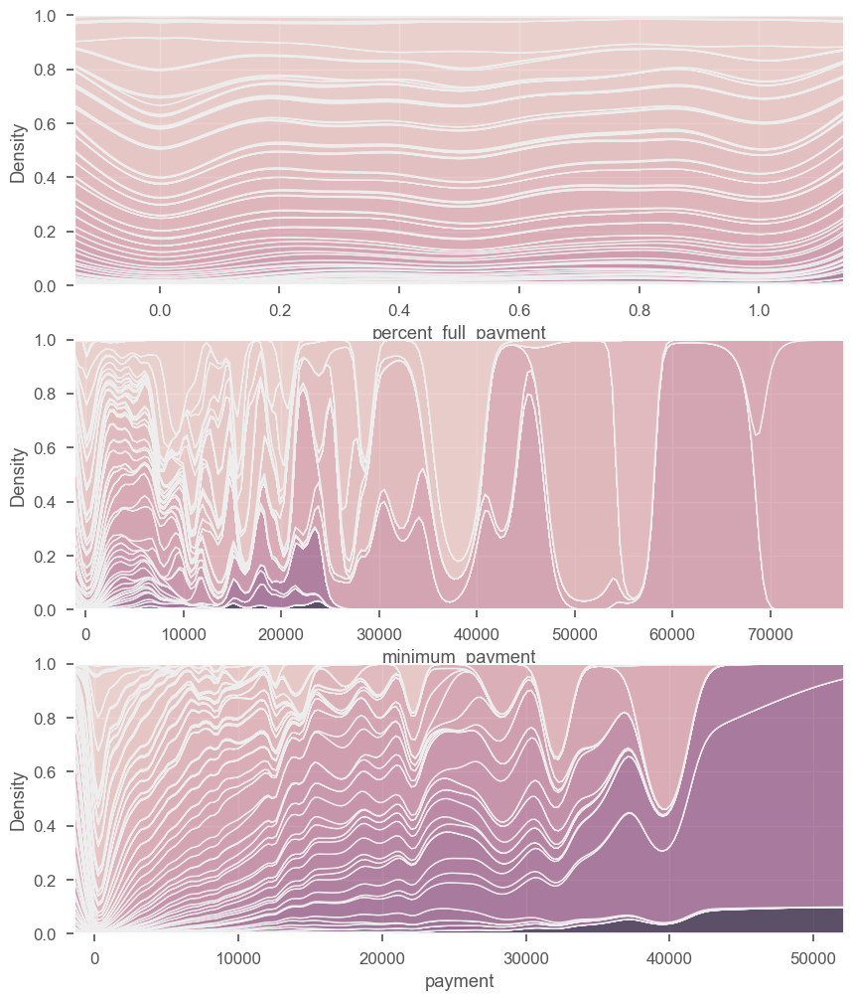

In [684]:
fig, axis = plt.subplots(3, 1, figsize=(10,12))
ax = sns.kdeplot(data=df_p, x="percent_full_payment", hue="credit_limit", multiple="fill", legend=False, ax=axis[0])
ax = sns.kdeplot(data=df_p, x="minimum_payment", hue="credit_limit", multiple="fill", legend=False, ax=axis[1])
sns.kdeplot(data=df_p, x="payment", hue="credit_limit", multiple="fill", legend=False, ax=axis[2])
# The legend is too long since there are so many values in credit_limit
# darker color, higher credit limit

* customers with higher credit limit tend to have very small percent of full payment, which indicate they have more stable spending habit.
* Their minimum payment suprisingly have lower compared to other customers with lower credit limit.
* Their payment are higher than other customers generally, yet the density is lower than middle credit limit customers, which may indicate that their payment habit is more conservative.

<AxesSubplot: xlabel='percent_full_payment', ylabel='Density'>

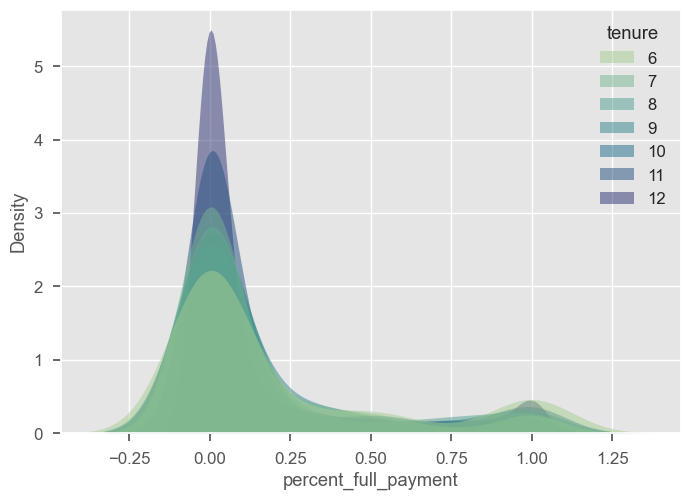

In [685]:
sns.kdeplot(data=df_p, x="percent_full_payment", 
            hue="tenure", fill=True, common_norm=False, 
            palette='crest', alpha=.5, linewidth=0)

## Model building

### PCA

In [686]:
pca = PCA(n_components=10)
pca.fit_transform(x)

array([[-1.68376780e+00, -1.07256996e+00,  4.77243657e-01, ...,
        -1.81955204e-02,  1.19089975e-01, -7.83150405e-02],
       [-1.13484630e+00,  2.50873805e+00,  6.03529143e-01, ...,
         1.76700220e-01,  6.75836224e-01, -7.78006030e-01],
       [ 9.69060364e-01, -3.83487471e-01,  9.26482605e-02, ...,
        -2.30295905e-01, -8.68962721e-01, -1.76822378e-03],
       ...,
       [-9.28481555e-01, -1.80772394e+00, -4.64896081e-01, ...,
        -3.00335603e-01,  8.04950965e-01, -8.28232164e-01],
       [-2.33744203e+00, -6.53444717e-01,  9.76833698e-01, ...,
         2.23699545e-01,  1.20072939e+00,  2.70437436e-01],
       [-5.57577751e-01, -4.00281046e-01,  1.02684636e+00, ...,
        -4.12872241e-01, -8.38682823e-01,  3.48111183e-01]])

#### identify the number of n

Text(0.5, 1.0, 'Scree Plot')

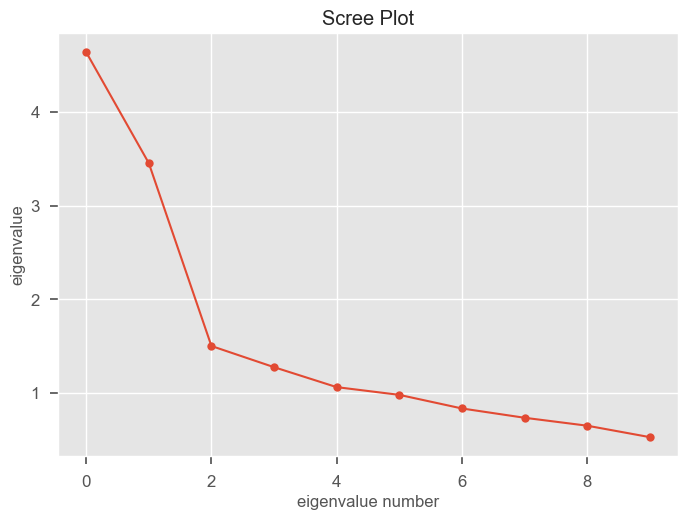

In [687]:
plt.style.use('ggplot')
plt.plot(pca.explained_variance_, marker='o')
plt.xlabel('eigenvalue number')
plt.ylabel('eigenvalue')
plt.title('Scree Plot')

When eigenvalue > 1, the elbow point is 2 or 3.

Text(0.5, 1.0, 'Scree Plot')

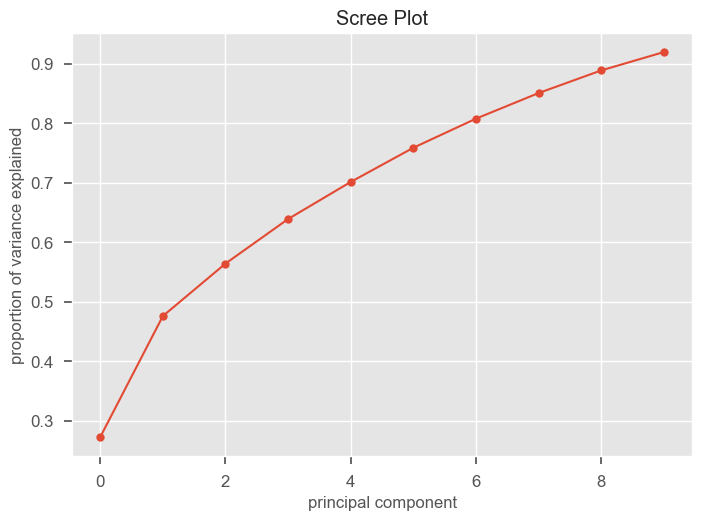

In [688]:
# check the pc values based on the variance pcs exlained
var = np.cumsum(pca.explained_variance_ratio_)
plt.style.use('ggplot')
plt.plot(var, marker='o')
plt.xlabel('principal component')
plt.ylabel('proportion of variance explained')
plt.title('Scree Plot')

* When n = 9, principle components are able to describe nearly 95% of the variance.
* However, the biggest slope appears at 2
* Also,for the aim to visualize the data, I will stick with 2 principle components

#### implement pca

,balance,balance_frequency,purchase,oneoff_purchase,installment_purchase,cash_advance,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,payment,minimum_payment,percent_full_payment,tenure,two_clusters,c1,c2
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.302427,-0.525588,0.360541,0,-1.631822,-1.073466
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.097453,0.234159,0.360541,0,-1.088547,2.508017
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.093330,-0.525588,0.360541,0,1.007885,-0.383720
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.228291,-0.525588,0.360541,0,-0.841118,0.003705
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.257295,-0.525588,0.360541,0,-1.545697,-0.684971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,-0.738015,0.517980,-0.333331,-0.356957,-0.132688,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.486266,-0.341275,1.183844,-4.126919,1,-0.781727,-2.008692
8945,-0.742488,0.517980,-0.329174,-0.356957,-0.122869,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.503445,-0.228291,-0.525588,-4.126919,1,-0.995201,-1.671059
8946,-0.740463,-0.185895,-0.402000,-0.356957,-0.294930,-0.466805,0.854463,-0.678716,0.760359,-0.675294,-0.476083,-0.390691,-0.960380,-0.570660,-0.326900,0.329128,-4.126919,1,-1.343603,-1.803595
8947,-0.745239,-0.185895,-0.469584,-0.356957,-0.454607,-0.449373,-1.221928,-0.678716,-0.917090,0.157536,-0.183026,-0.591841,-1.097795,-0.580581,-0.338330,0.329128,-4.126919,1,-2.742753,-0.649715


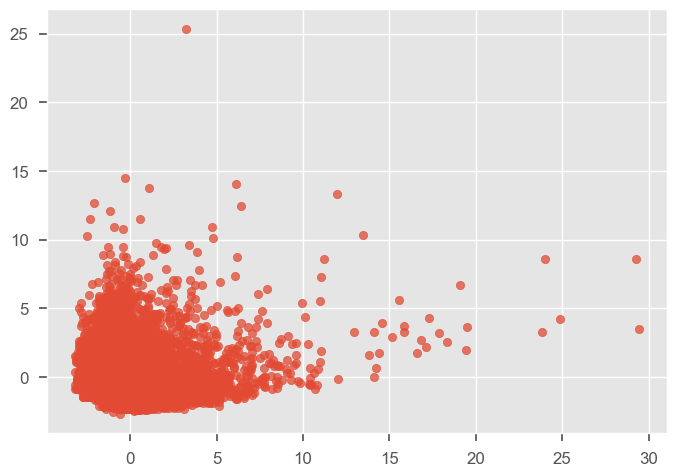

In [702]:
pca = PCA(n_components=2)
pca_val = pca.fit_transform(x)
x['c1'] = [item[0] for item in pca_val]
x['c2'] = [item[1] for item in pca_val]
x

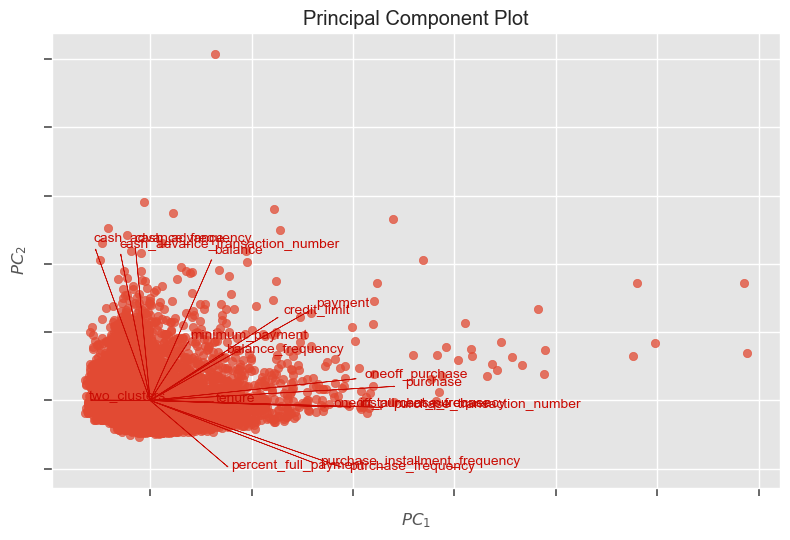

<AxesSubplot: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [703]:
x2 = x.drop(['c1' ,'c2'], axis=1)
from yellowbrick.features import PCA
visualizer = PCA(scale=True, proj_features = True)
visualizer.fit_transform(x2)
visualizer.show()

* Okay, it seems the number of the principle components is small for so many attributes in this dataset. Some of the projection direction seems to be too closed.
* Anyway, for the need of visualization of clusters, principle components = 2 will be implemented.

### KMeans

#### identify the number of k

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  war

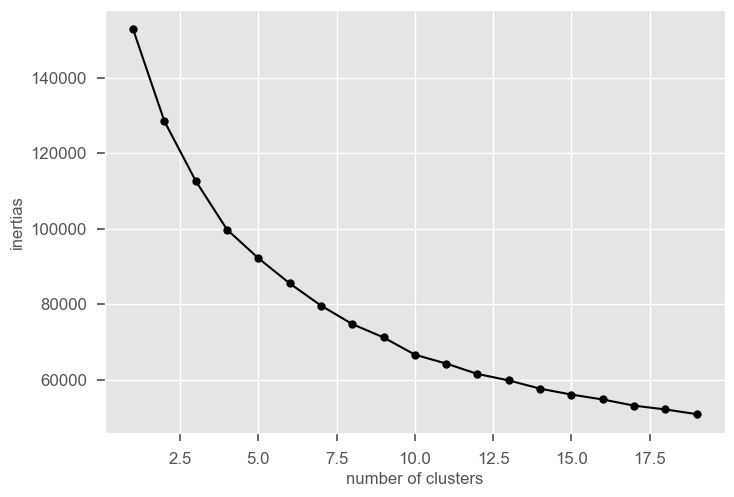

In [704]:
# first try all attributes except principle component columns
ks = range(1, 20)
inertias = []
for k in ks:
    k_model = KMeans(n_clusters=k)
    k_model.fit(x.iloc[:,:-2])
    inertias.append(k_model.inertia_)
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters')
plt.ylabel('inertias')
plt.show()

* 3, 4, 5, 6, maybe
* The elbow point is not very clear, which means that the elbow score is not enough.
* Try the pca attributes further

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  war

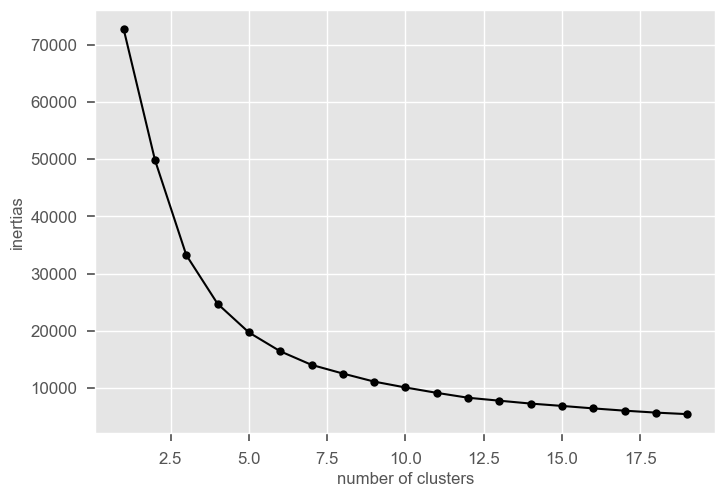

In [707]:
ks = range(1, 20)
inertias = []
for k in ks:
    k_model = KMeans(n_clusters=k)
    #select the pca columns
    k_model.fit(x.iloc[:,-2:])
    inertias.append(k_model.inertia_)
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters')
plt.ylabel('inertias')
plt.show()

* Using principle components columns is more clear than using all attributes.
* it is 3 or 4

In [708]:
X = x.iloc[:, -2:]
X

,c1,c2
0,-1.631822,-1.073466
1,-1.088547,2.508017
2,1.007885,-0.383720
3,-0.841118,0.003705
4,-1.545697,-0.684971
...,...,...
8944,-0.781727,-2.008692
8945,-0.995201,-1.671059
8946,-1.343603,-1.803595
8947,-2.742753,-0.649715


/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  war

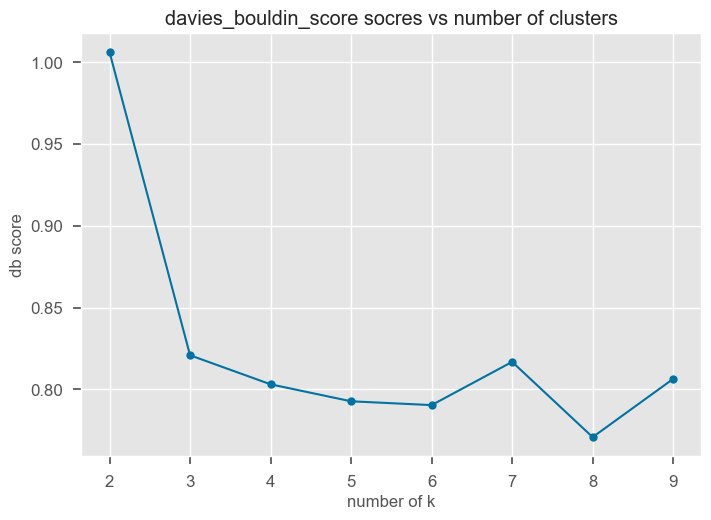

In [709]:
db_davies_bouldin_scores = []
for i in range(2, 10): 
    km_m = KMeans(n_clusters= i)
    db_s = davies_bouldin_score(X, km_m.fit(X).labels_) 
    db_davies_bouldin_scores.append(db_s)

plt.plot(range(2, 10), db_davies_bouldin_scores, 'bo-')
plt.title('davies_bouldin_score socres vs number of clusters')
plt.ylabel('db score')
plt.xlabel('number of k')
plt.show()

* k=2 is the best, then is 3 or 4.

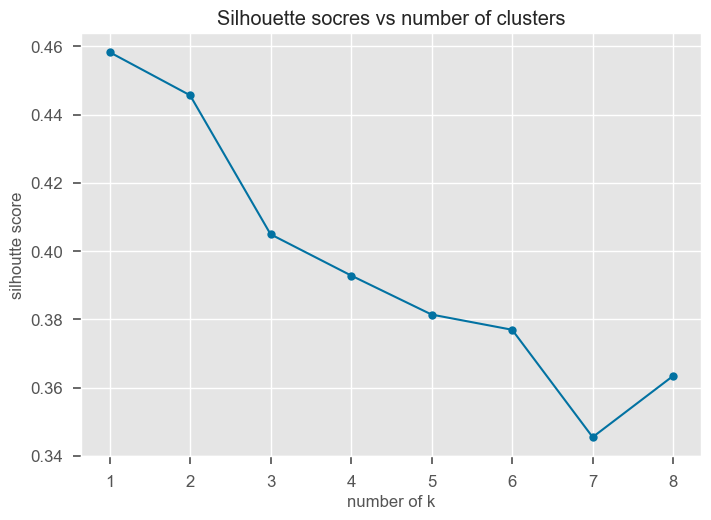

In [710]:
kmeans_models = [KMeans(n_clusters = k, n_init='auto').fit(X) for k in range(1, 10)]
silhoutte_scores = [silhouette_score(X, model.labels_) for model in kmeans_models[1: 10]]
plt.plot(range(1,9), silhoutte_scores, 'bo-')
plt.title('Silhouette socres vs number of clusters')
plt.ylabel('silhoutte score')
plt.xlabel('number of k')
plt.show()

* The higher silhouette score, the better the number. At this point, 2 is better.
* However, 3 is where the score begins to stablize, which may indicate that from k=3, the number and shape of clusters may begin to be stable. 
* 4 is also a stable point. All 2, 3 and 4 will be tried.

#### build the clusters

##### k = 2

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<AxesSubplot: xlabel='c1', ylabel='c2'>

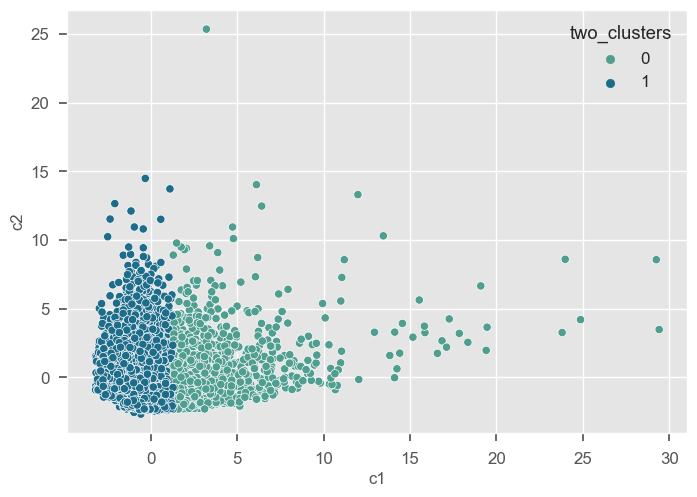

In [711]:
kmeans_model = KMeans(n_clusters=2, init = 'random')
kmeans_model.fit(x.iloc[:, -2:])
x["two_clusters"] = pd.Series(kmeans_model.predict(x.iloc[:, -2:]), index=x.index)
sns.scatterplot(data=x, x="c1", y="c2",  hue="two_clusters", palette='crest')

<AxesSubplot: xlabel='two_clusters', ylabel='count'>

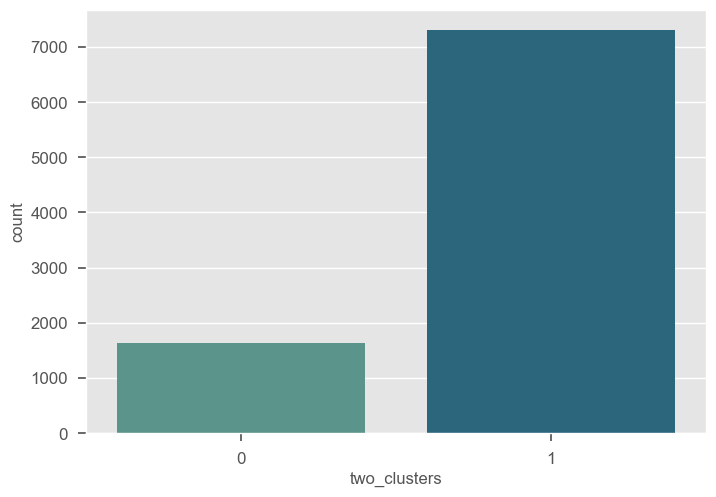

In [712]:
sns.countplot(data = x, x="two_clusters", palette="crest")

##### k =3

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<AxesSubplot: xlabel='c1', ylabel='c2'>

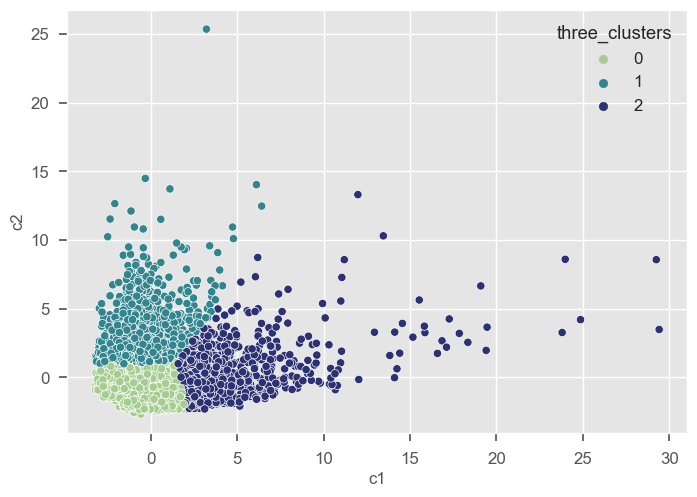

In [713]:
x = x.drop('two_clusters', axis=1)
kmeans_model = KMeans(n_clusters=3, init = 'random')
kmeans_model.fit(x.iloc[:, -2:])
x["three_clusters"] = pd.Series(kmeans_model.predict(x.iloc[:, -2:]), index=x.index)
sns.scatterplot(data=x, x="c1", y="c2",  hue="three_clusters", palette='crest')

<AxesSubplot: xlabel='three_clusters', ylabel='count'>

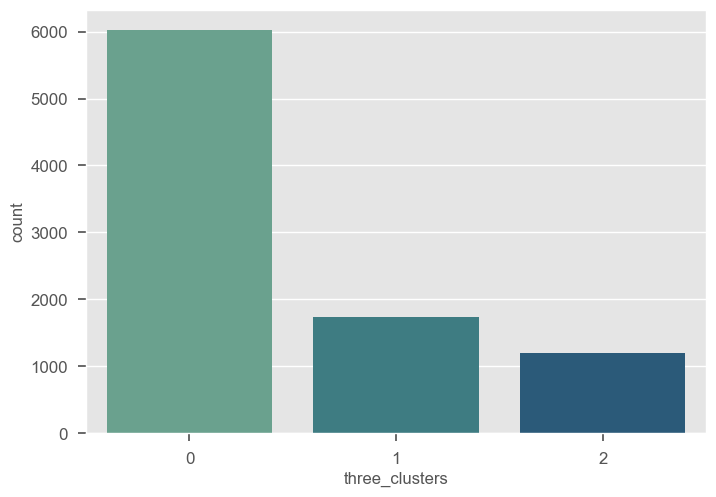

In [714]:
sns.countplot(data = x, x="three_clusters", palette="crest")

* three clusters seem to be too imbalanced

##### k = 4

In [715]:
x = x.drop("three_clusters", axis=1)
kmeans_model = KMeans(n_clusters=4, init = 'random')
kmeans_model.fit(x.iloc[:, -2:])
x["four_clusters"] = pd.Series(kmeans_model.predict(x.iloc[:, -2:]), index=x.index)

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<AxesSubplot: xlabel='c1', ylabel='c2'>

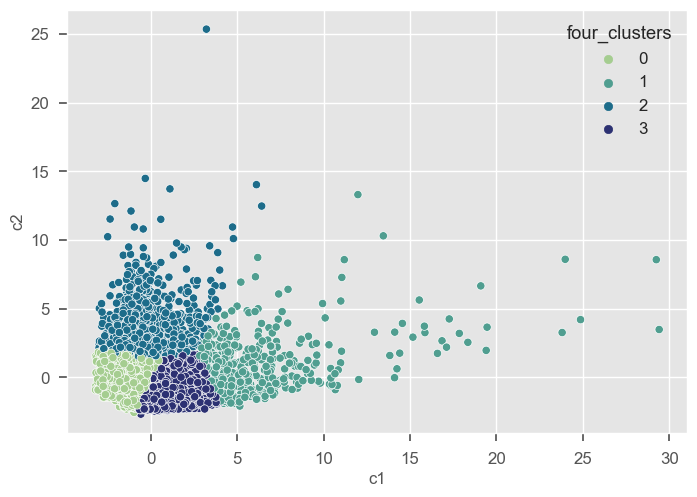

In [716]:
sns.scatterplot(data=x, x="c1", y="c2",  hue="four_clusters", palette='crest')

<AxesSubplot: xlabel='four_clusters', ylabel='count'>

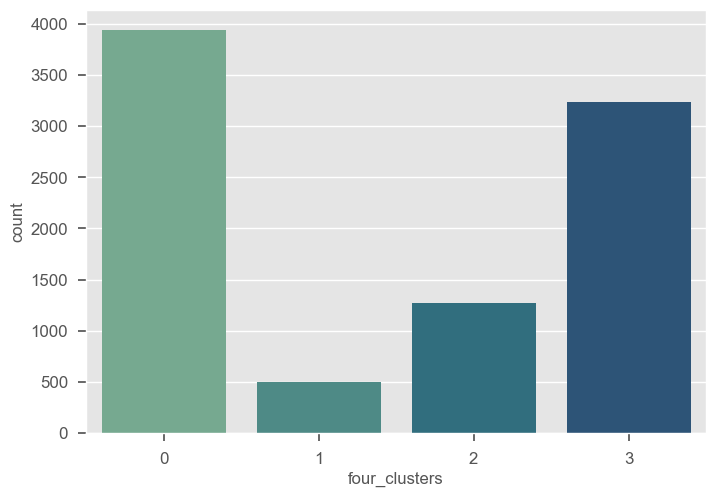

In [717]:
sns.countplot(data = x, x="four_clusters", palette="crest")

* the scatterplot based on principle components seems pretty good 
* the countplot shows that the distribution of clusters is a little bit imbalanced, but generally good.
* k = 4 is better than k = 3

#### evaluate the clusters

* Silhouette score: [-1, 1], 
* Davies-Bouldin score:
* Calinski-Harabasz score: 

In [718]:
X = x.iloc[:, -3:-1]
X

,c1,c2
0,-1.631822,-1.073466
1,-1.088547,2.508017
2,1.007885,-0.383720
3,-0.841118,0.003705
4,-1.545697,-0.684971
...,...,...
8944,-0.781727,-2.008692
8945,-0.995201,-1.671059
8946,-1.343603,-1.803595
8947,-2.742753,-0.649715


In [719]:
def evaluate(x, y):
    s_score = round(silhouette_score(x, y), 3)
    db_score = round(davies_bouldin_score(x, y), 3)
    ch_score = round(calinski_harabasz_score(x,y), 3)
    print('Silhouette score: ', s_score)
    print('Davies-Bouldin score: ', db_score)
    print('Calinski harabasz score: ', ch_score)
    return s_score, db_score, ch_score

In [720]:
kmeans = KMeans(n_clusters=2)
kmeans_y = kmeans.fit_predict(X)
km2_ss, km2_db, km2_ch = evaluate(X, kmeans_y)

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score:  0.458
Davies-Bouldin score:  1.005
Calinski harabasz score:  4105.365


In [721]:
kmeans = KMeans(n_clusters=3)
kmeans_y = kmeans.fit_predict(X)
km3_ss, km3_db, km3_ch = evaluate(X, kmeans_y)

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score:  0.446
Davies-Bouldin score:  0.821
Calinski harabasz score:  5311.985


In [722]:
kmeans_y =KMeans(n_clusters=4).fit_predict(X)
km4_ss, km4_db, km4_ch = evaluate(X, kmeans_y)

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette score:  0.405
Davies-Bouldin score:  0.803
Calinski harabasz score:  5784.95


* The silhouette score and Davies-Bouldin score decreases with the increase of k, while the Calinski harabasz score increases.

### DBSCAN

* two hyperparameters: 
    * minpoints: the minimal points for one cluster: normally, it ought to be >n+1 (n dimension)
        * so, here it is 3
    * epsilon: below what number that it will be considered neighbors
        * it requires to check based on the distance
        * method: knn

#### identify the number of epsilon

In [723]:
knn = NearestNeighbors(n_neighbors=2)
knns = knn.fit(X)
distances, indices = knns.kneighbors(X)

In [724]:
# the distances to the closest neighbors
distances

array([[0.        , 0.00702323],
       [0.        , 0.08345539],
       [0.        , 0.01376966],
       ...,
       [0.        , 0.03260748],
       [0.        , 0.0963358 ],
       [0.        , 0.05017425]])

In [725]:
# sort the values of distances
distances = np.sort(distances, axis=0)
# choose the distance part, which is 1
distances = distances[:, 1]
distances

array([2.07710864e-04, 2.07710864e-04, 4.00428361e-04, ...,
       4.60595268e+00, 5.09008183e+00, 1.14345360e+01])

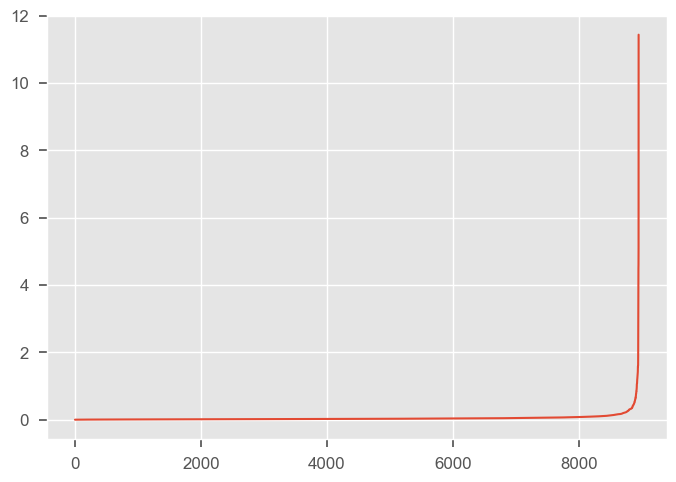

In [726]:
plt.plot(distances)

* it looks like 1. let's narrow the range of y to further check

(0.0, 0.5)

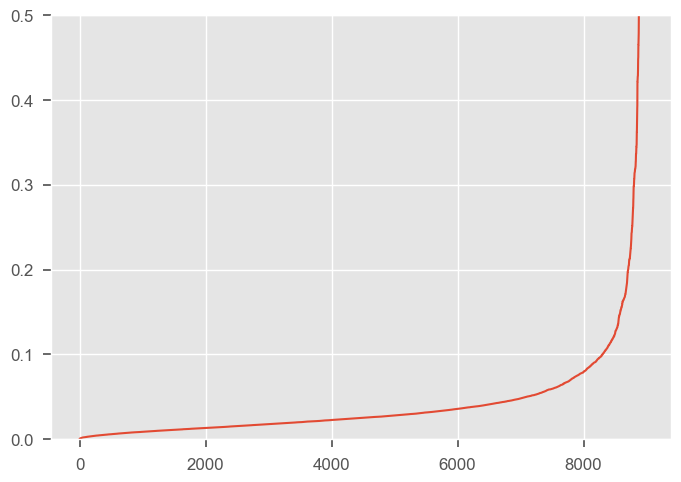

In [727]:
# y is too long, make it short
plt.plot(distances)
plt.ylim(0,0.5)

* The optimal point is where it has the max curve, so it is 0.1

In [728]:
dbscan_model = DBSCAN(eps = 0.1, min_samples = 3)
dbscan = dbscan_model.fit(X)
clusters = dbscan.labels_
# compute how many clusters
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
print("number of clusters: ", n_clusters)

number of clusters:  151


* too many clusters, try epsilon = 1

In [729]:
dbscan_model = DBSCAN(eps = 1, min_samples = 3)
dbscan = dbscan_model.fit(X)
clusters = dbscan.labels_
# compute how many clusters
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
print("number of clusters: ", n_clusters)

number of clusters:  3


* better number, easy for visualization, choose epsilon = 1

#### visualize different epsilon

<AxesSubplot: xlabel='c1', ylabel='c2'>

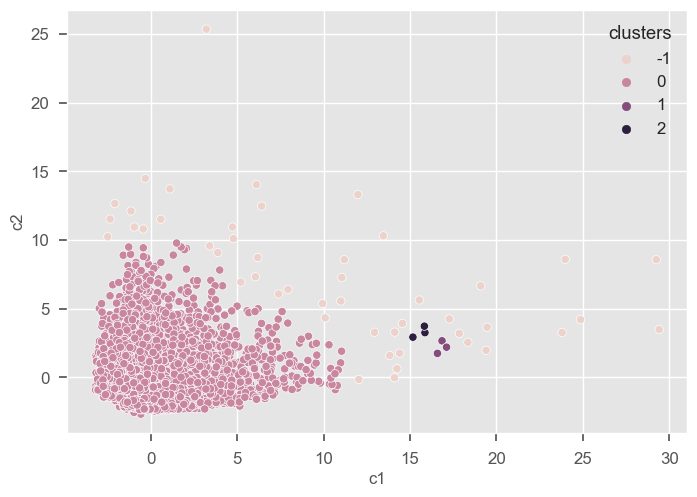

In [732]:
dbscan_model = DBSCAN(eps = 1, min_samples = 3)
dbscan = dbscan_model.fit(X)
labels = dbscan.labels_
X["clusters"] = labels
sns.scatterplot(x="c1", y="c2", data=X, hue="clusters")

* -1 is outliers, clearly that epsilon maybe too small, which makes it consider many points into outliers
* 1 and 2 are close, and they ought to be in the same group, try epsilon = 2

<AxesSubplot: xlabel='c1', ylabel='c2'>

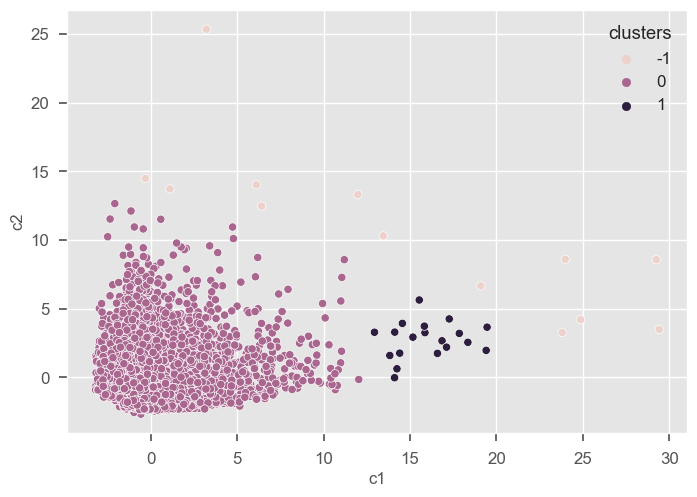

In [734]:
X = X.drop("clusters", axis=1)
dbscan_model = DBSCAN(eps = 2, min_samples = 3)
dbscan = dbscan_model.fit(X)
labels = dbscan.labels_
X["clusters"] = labels
sns.scatterplot(x="c1", y="c2", data=X, hue="clusters")

* Better than the last one. -1 is the noise group, which is smaller. 0 and 1 are two clusters.
* However the group 0 seems to lack of discrimination
* try epsilon=0.1, which used to be thought to have too many clusters

<AxesSubplot: xlabel='c1', ylabel='c2'>

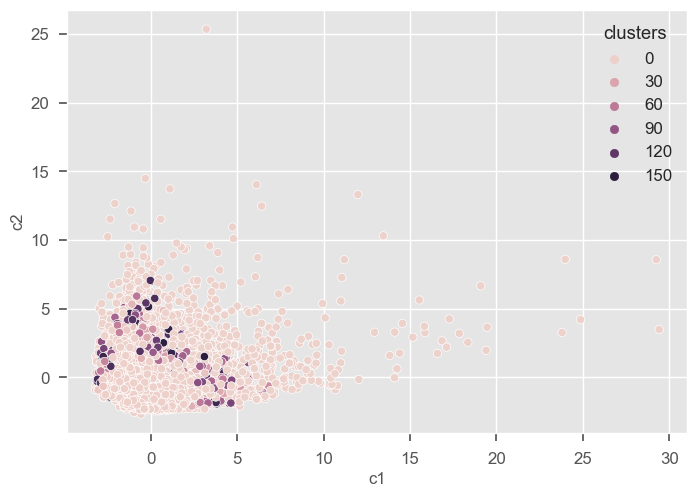

In [735]:
X = X.drop("clusters", axis=1)
dbscan_model = DBSCAN(eps = 0.1, min_samples = 3)
dbscan = dbscan_model.fit(X)
labels = dbscan.labels_
X["clusters"] = labels
sns.scatterplot(x="c1", y="c2", data=X, hue="clusters")

* okay, it looks much more terrible, too many outliers, which may be because:
    1. density based clusters are affected by outliers more significantly compared to partitional clustering like kmeans, which makes it more suitable for identify the main group in the dataset
    2. pca = 2, which may be small for density-based DBSCAN. Too few dimensions may restrain the dividing ability based on the density.

#### evaluate the model

* Both 0.1 epsilon and 1 epsilon generate too many outliers, and 1 epsilon also divide groups a bit unreasonably
* Therefore, the final choice is epsilon = 2.

In [736]:
X = X.drop("clusters", axis=1)
dbscan_model = DBSCAN(eps = 2, min_samples = 3)
dbscan = dbscan_model.fit(X)
dbscan_y = dbscan_model.fit_predict(X)

In [737]:
db_ss, db_db, db_ch = evaluate(X, dbscan_y)

Silhouette score:  0.801
Davies-Bouldin score:  1.316
Calinski harabasz score:  659.632


* silhouette score is higher tahn kmeans
* davies-bouldin is also higher
* clinski-harabasz is much lower than kmeans

### Hierarchical clustering

In [738]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer

#### method choice

In [739]:
# ward method
dendrogram(linkage(X, method='ward', metric='euclidean'))
plt.ylabel('Euclidean distance')
plt.tight_layout()
plt.show()

KeyboardInterrupt: 

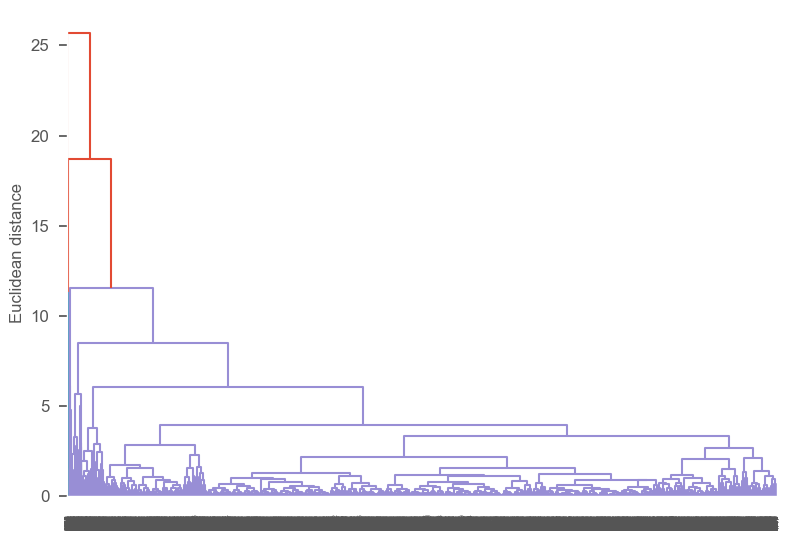

In [ ]:
# average distance method
linkage_data = linkage(X, method='average', metric='euclidean')
dendrogram(linkage_data)
plt.ylabel('Euclidean distance')
plt.tight_layout()
plt.show()

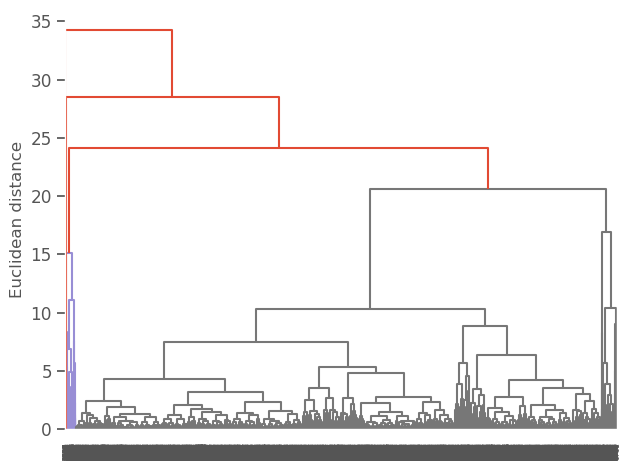

In [ ]:
# fartherst point method
linkage_data = linkage(X, method='complete', metric='euclidean')
dendrogram(linkage_data)
plt.ylabel('Euclidean distance')
plt.tight_layout()
plt.show()

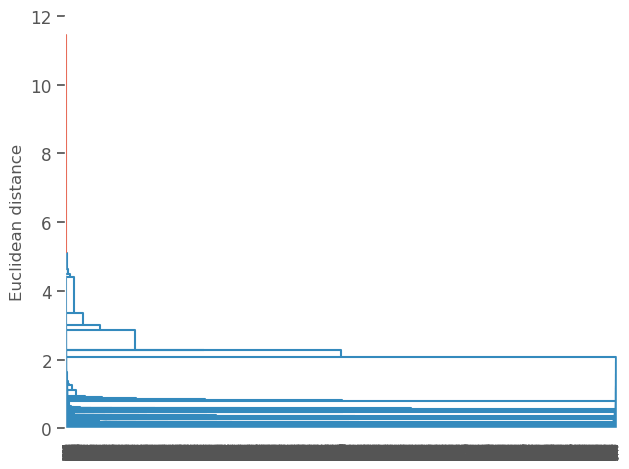

In [ ]:
# Nearest point method
dendrogram(linkage(X, method='single', metric='euclidean'))
plt.ylabel('Euclidean distance')
plt.tight_layout()
plt.show()

* nearest point method is the worst, which may be due to the high density because of only two dimensions(principle components)
* Judging from the dendrogram, ward method seems to be the best method.

#### number of cluster

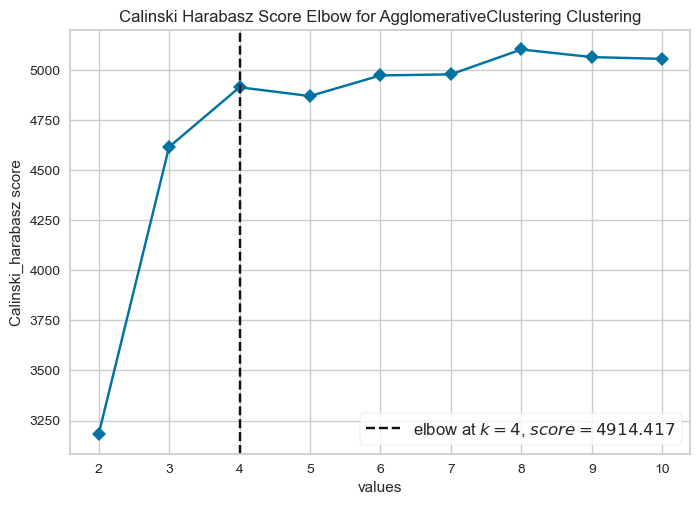

In [ ]:
hc_score = KElbowVisualizer(AgglomerativeClustering(), metric='calinski_harabasz', timings=False)
hc_score.fit(X)
hc_score.finalize()
hc_score.ax.set_xlabel('values')
hc_score.ax.set_ylabel('Calinski_harabasz score')
plt.show()

#### visualize

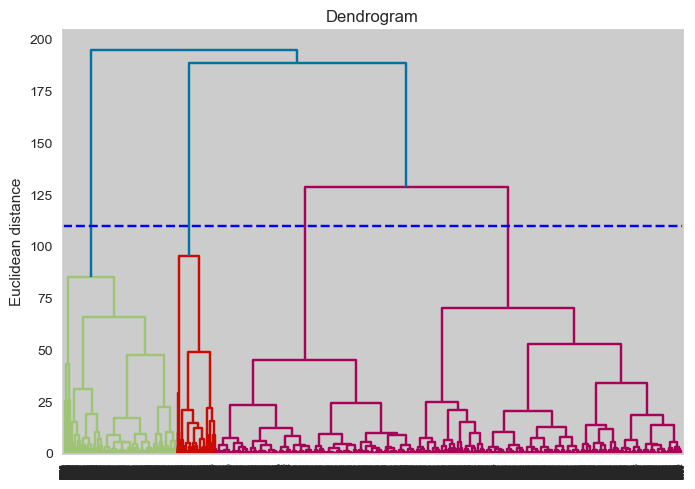

In [ ]:
ax = dendrogram(linkage(X, method='ward', metric='euclidean'))
plt.ylabel('Euclidean distance')
plt.title('Dendrogram')
plt.axhline(y=110, color='blue', linestyle='--')
plt.show()

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


<AxesSubplot: xlabel='c1', ylabel='c2'>

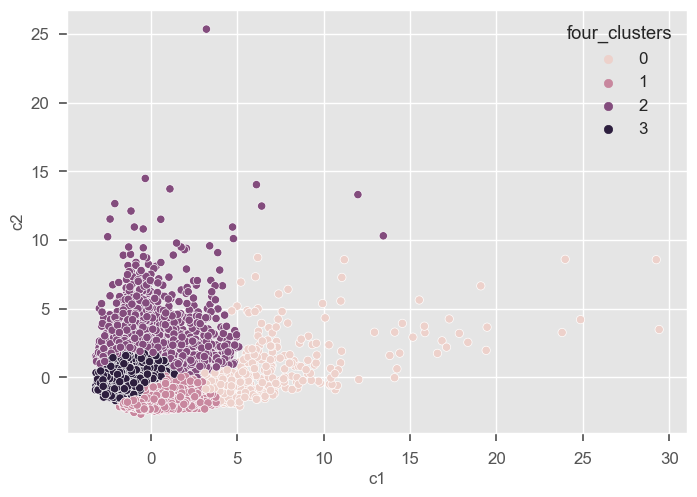

In [740]:
hc_m = AgglomerativeClustering(n_clusters=4, linkage='ward', affinity='euclidean')
hc = hc_m.fit(X)
X['four_clusters'] = hc.labels_
sns.scatterplot(data=X, x='c1', y='c2', hue='four_clusters')

<AxesSubplot: xlabel='four_clusters', ylabel='count'>

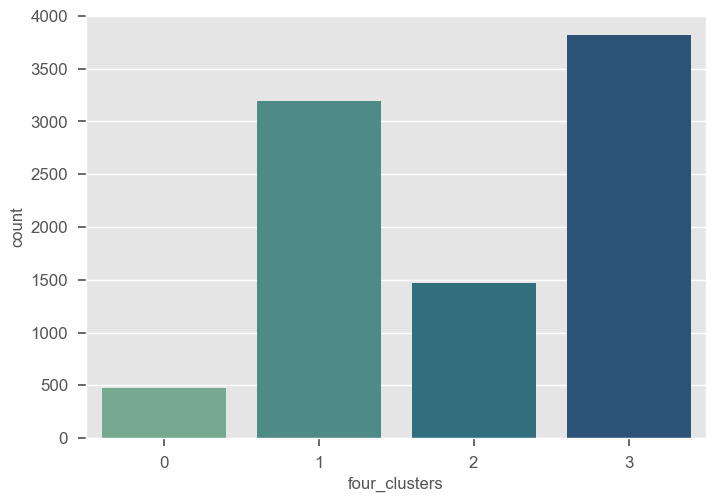

In [741]:
sns.countplot(x="four_clusters", data=X, palette='crest')

* Interesting, the scatterplot looks similar to k-means clustering when k = 4
* the countplot also looks similar to the kmeans countplot when k = 4, so the distribution of each label is also similar
* so for k-means clustering, I will choose k=4

## Model evaluate

In [ ]:
hc_model = AgglomerativeClustering(n_clusters=4, linkage='ward',affinity='euclidean')
hc_y = hc_model.fit_predict(X)
hc_ss, hc_db, hc_ch = evaluate(X, hc_y)

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Silhouette score:  0.436
Davies-Bouldin score:  0.745
Calinski harabasz score:  5651.655


In [ ]:
evaluation = pd.DataFrame({'model' : ['k-means', 'dbscan', 'hierarchical clustering'], 
    'silhouette score': [km4_ss,db_ss,hc_ss],
    'davies-bouldin score': [km4_db, db_db, hc_db],
    'calinski-harabasz score': [km4_ch, db_ch, hc_ch]})
evaluation

,model,silhouette score,davies-bouldin score,calinski-harabasz score
0,k-means,0.407,0.801,5818.203
1,dbscan,0.803,1.323,669.423
2,hierarchical clustering,0.436,0.745,5651.655


In [ ]:
# melt the dataframe for visualization
em = evaluation.melt('model', var_name ='scores', value_name='vals')
# em['vals'] = MinMaxScaler().fit_transform(em[['vals']])
# calinski-harabasz score is too large, make a plot to focus on the first two scores
evaluation2 = evaluation.drop("calinski-harabasz score", axis=1)
em2 = evaluation2.melt('model', var_name='scores', value_name='vals')
# em2['vals'] = MinMaxScaler().fit_transform(em2[['vals']])

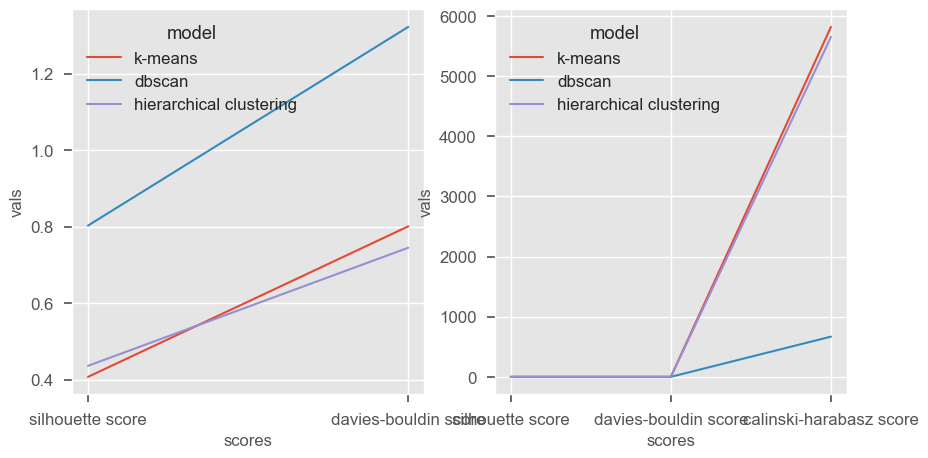

In [ ]:
fig, axis = plt.subplots(1, 2, figsize=(10, 5))
ax = sns.lineplot(x="scores", y="vals", hue="model",data=em2, markers='o', ax=axis[0], palette='crest')
ax = sns.lineplot(x='scores', y='vals', hue='model', data=em, markers='o', ax=axis[1], palette='crest')

* scores: 
    * dbscan have higher silhouette score and davies bouldin score, but it also has a much worse calinski-harabasz score
    * kmeans and hierarchical clustering represent similarly, kmeans clustering has higher davies bouldin score and calinski harabasz score
* explainantion: 
* final choice: 
    * Considering the kmeans model and hierarchical clustering presents the similar prediction which is shown in the scatter plot and count plot, it is obvious that the distribution of clusters of these two is more robust.
    * Besides, the more balanced distribution of groups is beneficial for analysing different groups of card customers.
    * One major problem of dbscan is that it is a density based clustering, which makes it effective to identify the major customer group. However, it is not the intention of my analysis.

## Model interpretation

* attribute:
    * balance, credit limit, tenure
    * purchase type: oneoff, installment, cash advance
    * purchase frequency
    * payment: payment, minimum, percent of full payments
* relationship (found in the eda process):
    * general condition: 
        * balance and credit limit
        * balance and balance frequency
        * tenure, balance and balance frequency
    * purchase type: 
        * purchase, oneoff purchase, installment puchase
        * purchase, credit limit, cash advance
    * purchase frequency:
        * tenure, purchase frequency, purchase transaction number
        * cash advance frequecy and purchase frequency
    * payment:
        * credit limit and percent of full payment
        * credit limit and minimum payment

In [742]:
X = X.drop('four_clusters', axis=1)
df['clusters'] = KMeans(n_clusters=4).fit_predict(X)
df

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,balance,balance_frequency,purchase,oneoff_purchase,installment_purchase,cash_advance,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,payment,minimum_payment,percent_full_payment,tenure,clusters
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,2
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.452292,0.000000,12,2
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,2
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,312.452292,0.000000,6,2
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,2
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,2


<AxesSubplot: xlabel='clusters', ylabel='count'>

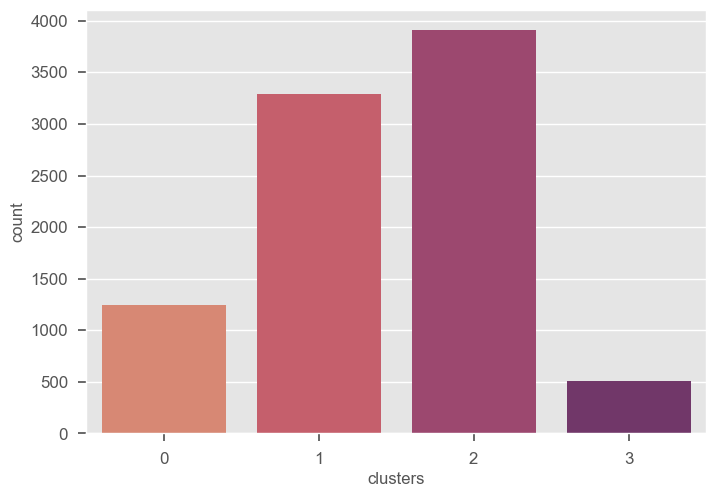

In [745]:
sns.countplot(data=df, x='clusters', palette='flare')

### general condition

<AxesSubplot: xlabel='balance', ylabel='credit_limit'>

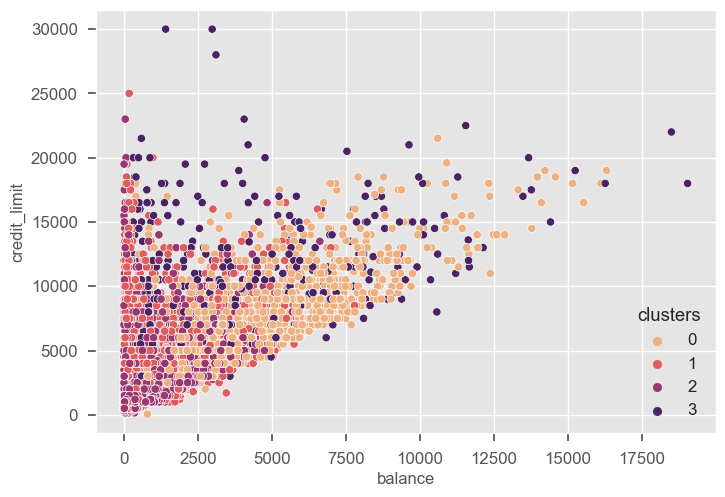

In [744]:
sns.scatterplot(data=df, x='balance', y='credit_limit',  hue="clusters", palette="flare")

* cluster 0 and 3 have higher balance and credit limit
* cluster 1 and 2 have less balance, indicating they tend to purchase more

<AxesSubplot: xlabel='clusters', ylabel='credit_limit'>

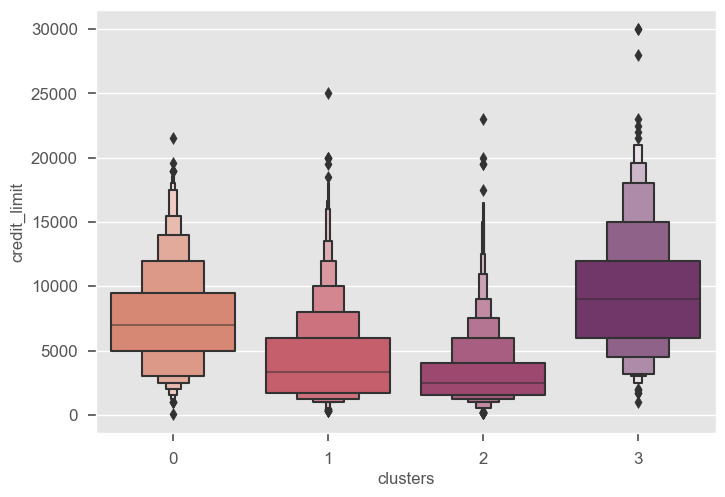

In [746]:
sns.boxenplot(data=df, x='clusters', y='credit_limit' ,palette='flare')

* cluster 0 and 3: high credit limit
* cluster 1 and 2: low credit limit
* credit limit: 3 > 0 > 1 > 2

<AxesSubplot: xlabel='clusters', ylabel='balance_frequency'>

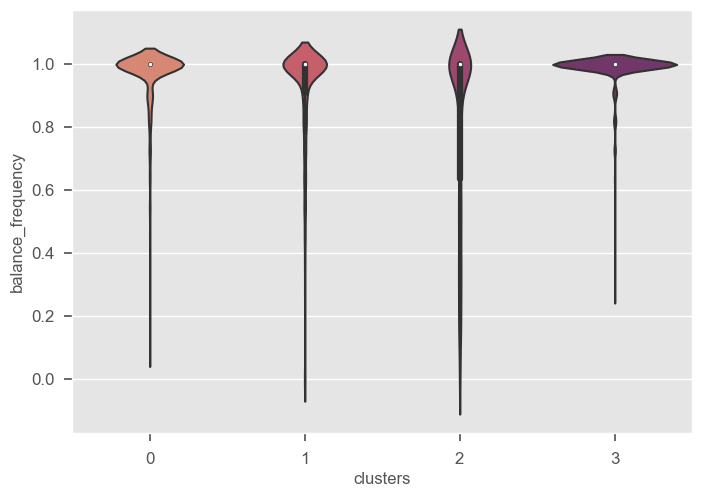

In [747]:
sns.violinplot(data=df, x="clusters", y='balance_frequency',palette="flare")

* cluster 3 has the highest balance frequency, then is cluster 0 (the violin plot is wider, meaning it is more concentrated near 1.0)
* cluster 1 and 2 have less balance frequency
* balance frequency: 3>0 >1>2

<AxesSubplot: xlabel='tenure', ylabel='balance_frequency'>

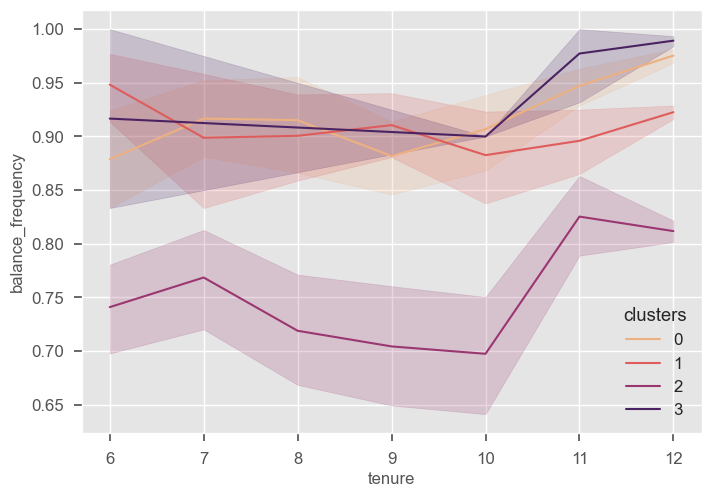

In [749]:
sns.lineplot(x='tenure', y='balance_frequency', data=df, hue='clusters', palette='flare')

* longer tenure, more balance frequency
* the balance of cluster 2 seems to be the most related with tenure, while the balance frequency of cluster 0 seems to be stable regardless of the longth of tenure

### purchase 

In [750]:
df.groupby('clusters').mean()

,balance,balance_frequency,purchase,oneoff_purchase,installment_purchase,cash_advance,purchase_frequency,oneoff_purchase_frequency,purchase_installment_frequency,cash_advance_frequency,cash_advance_transaction_number,purchase_transaction_number,credit_limit,payment,minimum_payment,percent_full_payment,tenure
clusters,,,,,,,,,,,,,,,,,
0,4506.889230,0.963888,462.278843,300.042851,162.335325,4395.733010,0.265565,0.129337,0.165718,0.470545,13.773494,6.678715,7453.176342,3543.921063,2074.746302,0.035251,11.449799
1,842.620025,0.920644,1238.846757,626.877247,612.174405,154.575296,0.856240,0.304519,0.667520,0.031864,0.592333,21.312747,4301.938014,1342.837775,580.122806,0.278954,11.754183
2,995.578705,0.798985,217.899575,151.507026,66.722338,610.972660,0.194236,0.072102,0.115373,0.121714,2.247826,2.909207,3062.200341,842.996590,542.274295,0.069071,11.283632
3,3409.367768,0.988518,6862.069961,4488.803037,2374.450355,771.262149,0.954802,0.726030,0.808974,0.084630,2.351085,82.658777,9522.583826,6685.251043,1877.159270,0.285741,11.960552


<AxesSubplot: xlabel='cash_advance', ylabel='purchase'>

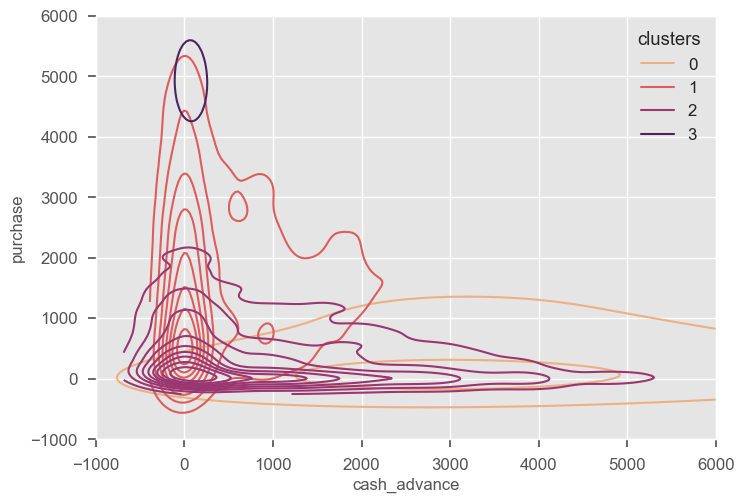

In [751]:
sns.kdeplot(x='cash_advance', y='purchase', hue='clusters', data=df, palette='flare',
            clip = (-1000, 6000))

* Interesting, cluster 3 users seldom use cash advance, but have a high purchase sum.
* cluster 1 customers mainly use the credit card for purchase and not interested in using credit card to withdraw money.
* cluster 0 users are frequently use cash advance service, which indicates they use the credit card mainly for purchase by cash.
* cluster 2 also sometimes use cash advance service


<AxesSubplot: xlabel='clusters', ylabel='oneoff_purchase'>

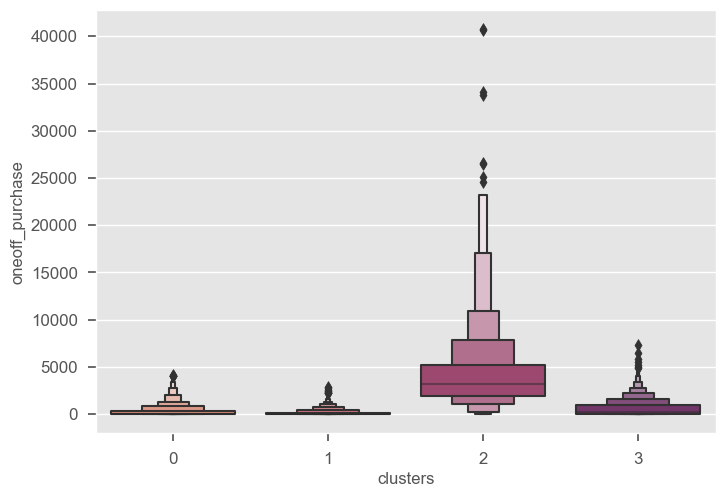

In [ ]:
sns

/Users/yueqizhang/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


<AxesSubplot: xlabel='oneoff_purchase', ylabel='purchase'>

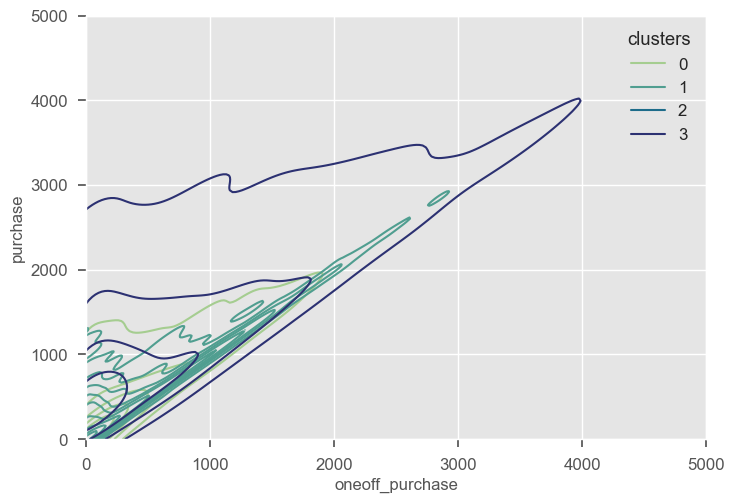

In [ ]:
sns.kdeplot(x='oneoff_purchase', y='purchase', data=df, 
            palette='crest', hue='clusters', 
            clip=(0, 5000))


<AxesSubplot: xlabel='oneoff_purchase', ylabel='purchase'>

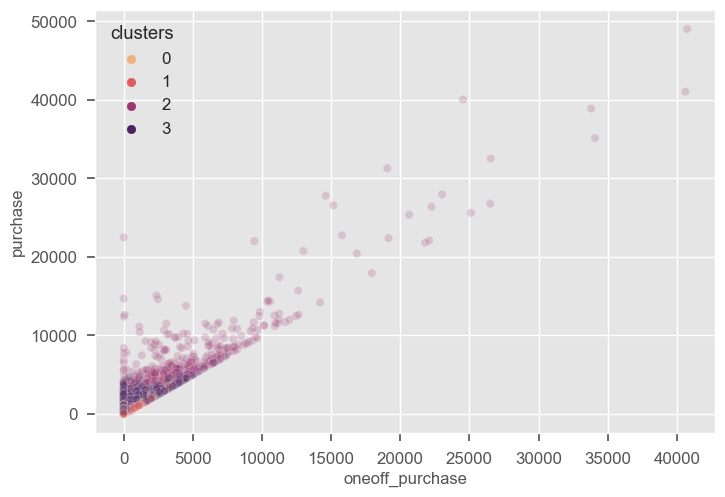

In [ ]:
sns.scatterplot(x='oneoff_purchase', y='purchase', data=df, 
            palette='flare', hue='clusters', alpha=.2
            )
